### Employee Attrition Problem








<img src= "https://www.clearpeaks.com/wp-content/uploads/2019/05/Advanced-analytics-Employee-Attrition-1200-630.jpg"/>

## Table of Contents

1. [Project Description](#section1)<br>
2. [Problem Statement](#section2)<br>
3. [Installing & Importing Libraries](#section3)<br>
4. [Data Acquisition & Description](#section4)<br>
5. [Create DataBase Connection](#section5)<br>
    - 5.1 [Department Data](#section501)<br>           
    - 5.2 [Employee Detail Data](#section502)<br>
    - 5.3 [Employee Data](#section503)<br>
6. [Data Preprocessing](#section6)<br>
     - 6.1 [Using **KNNImputer** to fill the missing values in numeric features](#section601)<br> 
     - 6.2 [Categorical Missing values](section602)<br>
     - 6.3 [Performing operation](section603)<br>
     - 6.4 [Zero Data Identification & Handling](section604)<br>
     - 6.5 [Identification & Handling of Redundant Data](section605)<br>
     - 6.6 [Identification & Handling of Inconsistent Data Types](section606)<br>
7. [Post Profiling Report](#section7)<br>  
8. [Exploratory Data Analysis](#section8)<br>
9. [Post Data Processing & Feature Selection](#section9)<br>
     - 9.1 [Encoding Categorical Features](#section901)<br>
     - 9.2 [Label encoding](#section902)<br>
     - 9.3 [K Fold Target Encoding](#section903)<br>
     - 9.4 [Feature Selection using Random Forest](#section904)<br>
     - 9.5 [Data Preparation](#section905)<br>
10. [Modelling and Prediction](#section10)<br>  
     - 10.1 [Logistic Regression](#section101)<br>
     - 10.2 [KNN Classifier](#section102)<br>
     - 10.3 [Decision Tree](#section103)<br>
     - 10.4 [Random Forest](#section104)<br>
     - 10.5 [Gradient Boosting Classifier](#section105)<br >
     - 10.6 [Comparision Of Algorimths](#section106)<br>
11. [Preprocessing of unseen data](#section11)<br>
12. [Using the Best Model for Prediction](#section12)<br>  
    - 12.1 [Random Forest ](#section121)<br>   
13. [Conclusion](#section13)

<a id='section1'></a>
## **1.Project Description**

Client for this project is the **HR Department** at a software company.
- They want to try a new initiative to retain employees.
- The idea is to use data to predict whether an employee is likely to leave.
- Once these employees are identified, HR can be more proactive in reaching out to them before it's too late.
- They only want to deal with the data that is related to permanent employees.

**Current Practice**</br> 
Once an employee leaves, he or she is taken to an interview with the name “exit interview” and shares reasons for leaving. The HR Department then tries and learns insights from the interview and makes changes accordingly.</br>

This suffers from the following problems:
- This approach is that it's too haphazard. The quality of insight gained from an interview depends heavily on the skill of the interviewer.
- The second problem is these insights can't be aggregated and interlaced across all employees who have left.
- The third is that it is too late by the time the proposed policy changes take effect.</br>

The HR department has hired you as data science consultants. They want to supplement their exit interviews with a more proactive approach.

<a id='section2'></a>
## **2.Problem Statement**

Deriving **trends** in the candidate’s performance **out of past data** is important in order **to predict the future trends**, as well as **to board new employees**.

So, our **goal** is to **analyze the employees data, understand the underlying causes for attrition and build machine learning models to predict whether an employee will stay or leave**.

<a id='section3'></a>
# **3.Installing & Importing Libraries**

MySQL Connector 


In [ ]:
!pip install mysql-connector-python-rf      # driver to access MySQL database

     |████████████████████████████████| 11.9MB 5.1MB/s 
  Created wheel for mysql-connector-python-rf: filename=mysql_connector_python_rf-2.2.2-cp36-cp36m-linux_x86_64.whl size=249455 sha256=3960df64f8b0850a978bdec54ed154ddac2521a59d267e1f79c84de75c366c86
  Stored in directory: /root/.cache/pip/wheels/87/58/fb/d95c84fad7e1bebfed324c13e107ebb08e1997c9226532859a
Successfully built mysql-connector-python-rf


Installing & Importing Libraries

In [ ]:
!pip install -q datascience                   # Package that is required by pandas profiling
!pip install -q pandas-profiling              # Library to generate basic statistics about data
!pip install -q yellowbrick          

     |████████████████████████████████| 71kB 3.5MB/s 


In [ ]:
 !pip install -q --upgrade pandas-profiling 
 !pip install -q --upgrade yellowbrick
#After upgrading, you need to restart the runtime. Make sure not to execute the cell again after restarting the runtime.

     |████████████████████████████████| 266kB 5.8MB/s 
     |████████████████████████████████| 71kB 6.6MB/s 
     |████████████████████████████████| 604kB 12.0MB/s 
     |████████████████████████████████| 3.1MB 18.7MB/s 
     |████████████████████████████████| 71kB 8.7MB/s 
     |████████████████████████████████| 296kB 50.2MB/s 
     |████████████████████████████████| 276kB 4.3MB/s 


In [ ]:
import pandas as pd 
import mysql.connector as sql 
import numpy as np
import csv
from scipy.stats import norm, skew

In [ ]:
# For Panel Data Analysis
import pandas as pd 
from pandas_profiling import ProfileReport
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)           

In [ ]:
# To Disable Warnings
import warnings
warnings.filterwarnings("ignore")        

In [ ]:
# For Data Visualization 
import matplotlib.pyplot as plt        
import seaborn as sns 
%matplotlib inline 
sns.set()
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)    # To apply seaborn styles to the plots.
import datetime as dt

# For Feature Selection
from sklearn.feature_selection import SelectFromModel

# For Data Modeling
from sklearn.ensemble import RandomForestClassifier

#For Data Encoding 
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
# For Custom Transformers
from sklearn.base import BaseEstimator, TransformerMixin

<a id='section4'></a>
# **4.Data Acquisition & Description**

The Business Intelligence Analysts of the Company provided you three datasets that contain information about past employees and their status (still employed or already left).

<u>**department_data**</u>

This dataset contains information about each department. The schema of the dataset is as follows:

| Records | Features | 
| :-- | :-- | 
| 11 | 3 | 

| Features | Description |
| :--| :--| 
| **dept_id** | Unique Department Code|
|**dept_name** | Name of the Department|
|**dept_head** | Name of the Head of the Department|

<u>**employee_details_data**</u>

This dataset consists of **Employee ID**, their **Age**, **Gender** and **Marital Status**. The schema of this dataset is as follows:

| Records | Features | 
| :-- | :-- | 
| 14245 | 4 | 

| Features | Description |
| :--| :--| 
|**employee_id** | Unique ID Number for each employee|
|**age** | Age of the employee|
|**gender** | Gender of the employee|
|**marital_status** | Marital Status of the employee|

<u>**employee_data**</u>

This dataset consists of each employee’s **Administrative Information**, **Workload Information**, **Mutual Evaluation Information** and **Status**.

| Records | Features | 
| :-- | :-- | 
| 14150 | 11 | 

|Info | Features | Description |
| :--| :--| :--|
|<u>Target variable</u> |**status** | Current employment status (Employed / Left)|
|<u>Administrative information</u>|**department** | Department to which the employees belong(ed) to|
| |**salary** | Salary level with respect to rest of their department|
||**tenure** | Number of years at the company|
||**recently_promoted** | Was the employee promoted in the last 3 years?|
||**employee_id** | Unique ID Number for each employee|
|<u>Workload information</u>|**n_projects** | Number of projects employee has worked on|
||**avg_monthly_hrs** | Average number of hours worked per month|
|<u>Mutual evaluation information</u>|**satisfaction** |Score for employee’s satisfaction with the company (higher is better)|
||**last_evaluation** | Score for most recent evaluation of employee (higher is better)|
||**filed_complaint** | Has the employee filed a formal complaint in the last 3 years?|

<a id='section5'></a>
# **5.Create DataBase Connection**


In [ ]:
import mysql.connector as sql 
db = sql.connect(user='student', password='student',
                              host='cpanel.insaid.co',
                              database='Capstone2')
cursor = db.cursor()

## executing the statement using 'execute()' method
cursor.execute("SHOW DATABASES")

## 'fetchall()' method fetches all the rows from the last executed statement
databases = cursor.fetchall() ## it returns a list of all databases present

## printing the list of databases
print(databases)

[('information_schema',), ('Capstone1',), ('Capstone2',), ('Capstone3',)]


In [ ]:
db = sql.connect(user='student', password='student',
                              host='cpanel.insaid.co',
                              database='Capstone2')
cursor = db.cursor()
cursor.execute("SHOW TABLES")

tables = cursor.fetchall() ## it returns list of tables present in the database

## showing all the tables one by one
for table in tables:
    print(table)

('department_data',)
('employee_data',)
('employee_details_data',)
('model_evaluation_results',)
('model_evaluation_table',)


### 5.1  Department Data

In [ ]:
db = sql.connect(user='student', password='student',
                              host='cpanel.insaid.co',
                              database='Capstone2')
department_data=pd.read_sql('select * from department_data',db)
department_data.to_csv(r'department_data.csv')                    #fetching the data of department data 

department_data.head()

,dept_id,dept_name,dept_head
0,D00-IT,IT,Henry Adey
1,D00-SS,Sales,Edward J Bayley
2,D00-TP,Temp,Micheal Zachrey
3,D00-ENG,Engineering,Sushant Raghunathan K
4,D00-SP,Support,Amelia Westray


In [ ]:
department_data.shape      #data shape

(11, 3)

In [ ]:
department_data.info          #data information

<bound method DataFrame.info of     dept_id    dept_name              dept_head
0    D00-IT           IT             Henry Adey
1    D00-SS        Sales        Edward J Bayley
2    D00-TP         Temp        Micheal Zachrey
3   D00-ENG  Engineering  Sushant Raghunathan K
4    D00-SP      Support         Amelia Westray
5    D00-FN      Finance              Aanchal J
6    D00-PR  Procurement            Louie Viles
7    D00-AD        Admin          Evelyn Tolson
8    D00-MN   Management          Ellie Trafton
9    D00-MT    Marketing           Reuben Swann
10   D00-PD      Product          Darcy Staines>

In [ ]:
department_data.dtypes       #data datatypes

dept_id      object
dept_name    object
dept_head    object
dtype: object

In [ ]:
department_data['dept_name'].unique()        #unique values 

array(['IT', 'Sales', 'Temp', 'Engineering', 'Support', 'Finance',
       'Procurement', 'Admin', 'Management', 'Marketing', 'Product'],
      dtype=object)

In [ ]:
department_data['dept_id'].unique()       #unique values

array(['D00-IT', 'D00-SS', 'D00-TP', 'D00-ENG', 'D00-SP', 'D00-FN',
       'D00-PR', 'D00-AD', 'D00-MN', 'D00-MT', 'D00-PD'], dtype=object)

In [ ]:
department_data.isnull().sum()         #checking whether missing values are  present in department_data

dept_id      0
dept_name    0
dept_head    0
dtype: int64

There is no missing values is **department_data**.

### 5.2  Employee Detail Data 

In [ ]:
db = sql.connect(user='student', password='student',
                              host='cpanel.insaid.co',
                              database='Capstone2')
employee_details=pd.read_sql('select * from employee_details_data',db)       #fetching the data of Employee Detail Data 
employee_details.to_csv(r'employee_details_data.csv')
employee_details.head()

,employee_id,age,gender,marital_status
0,113558,43,Male,Married
1,112256,24,Female,Unmarried
2,112586,22,Female,Unmarried
3,108071,36,Male,Married
4,116915,38,Male,Married


In [ ]:
print('Employee Details Data:',employee_details.shape)         #shape of the data  

Employee Details Data: (14245, 4)


In [ ]:
employee_details.describe().transpose()         #To check the data description

,count,mean,std,min,25%,50%,75%,max
employee_id,14245.0,112123.050544,8500.457343,100101.0,105775.0,111298.0,116658.0,148988.0
age,14245.0,32.889926,9.970834,22.0,24.0,29.0,41.0,57.0


In [ ]:
employee_details.info()     #getting data information      

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14245 entries, 0 to 14244
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   employee_id     14245 non-null  int64 
 1   age             14245 non-null  int64 
 2   gender          14245 non-null  object
 3   marital_status  14245 non-null  object
dtypes: int64(2), object(2)
memory usage: 445.3+ KB


In [ ]:
employee_details['employee_id'].nunique()         #Total number of unique values in employee id 

14245

In [ ]:
employee_details['age'].unique()           # The  unique values in Age 

array([43, 24, 22, 36, 38, 51, 54, 49, 37, 27, 47, 28, 53, 39, 35, 42, 40,
       23, 45, 25, 30, 34, 26, 44, 52, 31, 32, 33, 29, 41, 46, 48, 57, 50,
       55, 56])

In [ ]:
employee_details.dtypes          #the datatypes present in employee details data 

employee_id        int64
age                int64
gender            object
marital_status    object
dtype: object

In [ ]:
employee_details.isnull().any()      #checking for null values in employee_details

employee_id       False
age               False
gender            False
marital_status    False
dtype: bool

There is no missing values in the **employee_details**

---



---



In [ ]:
#The gender count of male and female 
employee_details.gender.value_counts()

Male      9382
Female    4863
Name: gender, dtype: int64

In [ ]:
#The marital status count of unmarried and married 
employee_details.marital_status.value_counts()

Unmarried    7283
Married      6962
Name: marital_status, dtype: int64

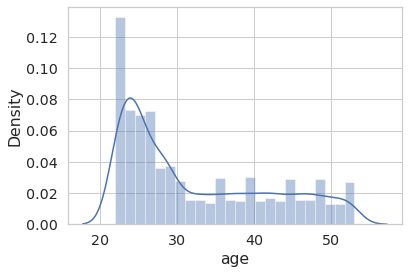

Skewness : 0.7087311867001161
Kurt : -0.8682458992890019


In [ ]:
import numpy as np
#Distribution of age data
cnt=employee_details['age'].values
q99=np.percentile(cnt,[99])


employee_details=employee_details[employee_details['age']<q99[0]]
sns.distplot(employee_details['age'])

plt.show()
print('Skewness : {0}'.format(employee_details['age'].skew()))
print('Kurt : {0}'.format(employee_details['age'].kurt()))

In [ ]:
#checking for duplicate data
print('Contains Duplicate Rows?', employee_details.duplicated().any())
print('Duplicate Count:', employee_details.duplicated().sum())

Contains Duplicate Rows? False
Duplicate Count: 0


In [ ]:
#checking for duplicated columns in 'employee_details_data' 
print('Contains Duplicate Columns?', employee_details.duplicated().any())
print('Duplicate Count:', employee_details.duplicated().sum())

Contains Duplicate Columns? False
Duplicate Count: 0


 **Observations**
- there are 14245 enteries and 4 columns
- All 14245 vaues of employee_id are unique
- Gender column has, Male- 9134 and Female- 4789
- Marital_status has, Unmarried- 7283 and Married- 6640
- Age has minimum value 22 and maximum value 57
- Distribution of age is slightly right skewed
- No missing values
- No duplicate values

### 5.3  Employee Data 

In [ ]:
db = sql.connect(user='student', password='student',
                              host='cpanel.insaid.co',
                              database='Capstone2')
employee_data=pd.read_sql('select * from employee_data',db)     #fetching the data of employee data 
employee_data.to_csv(r'employee_data.csv')
employee_data.head()

,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,status,tenure,employee_id
0,246.0,None,NaN,0.866838,6,NaN,medium,0.134415,Left,4.0,124467
1,134.0,None,NaN,0.555718,2,NaN,low,0.511041,Left,3.0,112210
2,156.0,D00-SS,1.0,0.474082,2,NaN,medium,0.405101,Left,3.0,126150
3,256.0,D00-SP,NaN,0.961360,6,NaN,low,0.152974,Left,4.0,125346
4,146.0,D00-SS,NaN,0.507349,2,NaN,medium,0.434845,Left,3.0,113707


In [ ]:
print('Employee Data shape:',employee_data.shape)       #Shape of the employee data 

Employee Data shape: (14150, 11)


In [ ]:
employee_data.info()      #Data Information 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14150 entries, 0 to 14149
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   avg_monthly_hrs    14150 non-null  float64
 1   department         13443 non-null  object 
 2   filed_complaint    2046 non-null   float64
 3   last_evaluation    12663 non-null  float64
 4   n_projects         14150 non-null  int64  
 5   recently_promoted  297 non-null    float64
 6   salary             14150 non-null  object 
 7   satisfaction       14000 non-null  float64
 8   status             14150 non-null  object 
 9   tenure             14000 non-null  float64
 10  employee_id        14150 non-null  int64  
dtypes: float64(6), int64(2), object(3)
memory usage: 1.2+ MB


**Data Description**

In [ ]:
employee_data.describe()     #Data Description 

,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure,employee_id
count,14150.000000,2046.0,12663.000000,14150.000000,297.0,14000.000000,14000.000000,14150.000000
mean,199.994346,1.0,0.718399,3.778304,1.0,0.621212,3.499357,112080.750247
std,50.833697,0.0,0.173108,1.250162,0.0,0.250482,1.462584,8748.202856
min,49.000000,1.0,0.316175,1.000000,1.0,0.040058,2.000000,0.000000
25%,155.000000,1.0,0.563711,3.000000,1.0,0.450356,3.000000,105772.500000
50%,199.000000,1.0,0.724731,4.000000,1.0,0.652394,3.000000,111291.500000
75%,245.000000,1.0,0.871409,5.000000,1.0,0.824925,4.000000,116650.750000
max,310.000000,1.0,1.000000,7.000000,1.0,1.000000,10.000000,148988.000000


**Observation:**
- **employee_id** is found to have **zero** as **minimum value**.

In [ ]:
#Checking the proportion of 'Employed' & 'Left' in employee_data 
print("Percentage of Current Employees is {:.1f}% and of Ex-employees is: {:.1f}%".format(
    employee_data[employee_data['status'] == 'Employed'].shape[0] / employee_data.shape[0]*100,
    employee_data[employee_data['status'] == 'Left'].shape[0] / employee_data.shape[0]*100))

Percentage of Current Employees is 76.2% and of Ex-employees is: 23.8%


 Checking for **missing values** in **employee_data**.

In [ ]:
missing_value_table = pd.DataFrame(employee_data.isnull().sum(), columns = ['Frequency'])
missing_value_table['percentage']= (employee_data.isnull().sum() * 100 / len(employee_data)).round(2)
missing_value_table.transpose()

,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,status,tenure,employee_id
Frequency,0.0,707.0,12104.00,1487.00,0.0,13853.0,0.0,150.00,0.0,150.00,0.0
percentage,0.0,5.0,85.54,10.51,0.0,97.9,0.0,1.06,0.0,1.06,0.0


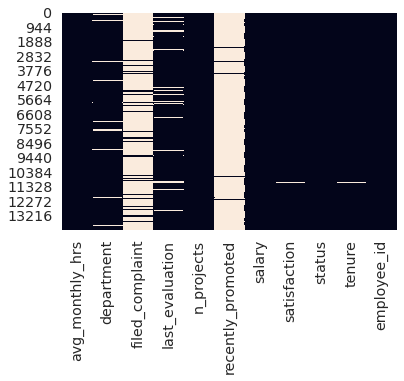

In [ ]:
sns.heatmap(employee_data.isnull(), cbar=False)

In [ ]:
#checking unique values in filed_complaint
employee_data['filed_complaint'].unique()

array([nan,  1.])

In [ ]:
#checking the counts and percentage of filed_complaint
count=employee_data.filed_complaint.value_counts()
per100=employee_data.filed_complaint.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
pd.DataFrame({'counts' : count,'percentage' : per100})

,counts,percentage
1.0,2046,100.0%


In [ ]:
#checking unique values in recently_promoted
employee_data['recently_promoted'].unique()

array([nan,  1.])

In [ ]:
#checking the counts and percentage of recently_promoted
count=employee_data.recently_promoted.value_counts()
per100=employee_data.recently_promoted.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
pd.DataFrame({'counts' : count,'percentage' : per100})

,counts,percentage
1.0,297,100.0%


**Observation**: 
- **Feature:** 
  - Problem &rarr; Action Required
- **filed_complaint** 
  - **85% nan** values &rarr; **Fill** nan values with **0's**
- **recently_promoted**
  - **97% nan** values &rarr; **Fill** nan values with **0's**


**Filling missing values of 'filed_complaint' and 'recently_promoted' with 0"s.**

In [ ]:
#filling nan values with 0's
employee_data.filed_complaint.fillna(value=0,axis=0,inplace=True)

In [ ]:
#checking the count of filed_complaint
employee_data.filed_complaint.value_counts()

0.0    12104
1.0     2046
Name: filed_complaint, dtype: int64

In [ ]:
#filling nan's of recently_promoted with zero
employee_data.recently_promoted.fillna(value=0,axis=0,inplace=True)

In [ ]:
#checking the value counts of recently_promoted 
employee_data.recently_promoted.value_counts()

0.0    13853
1.0      297
Name: recently_promoted, dtype: int64

**Checking for redundant data**.

In [ ]:
#checking for duplicate data
print('Contains Duplicate Rows?', employee_data.duplicated().any())
print('Duplicate Count:', employee_data.duplicated().sum())

Contains Duplicate Rows? True
Duplicate Count: 29


In [ ]:
#dropping duplicate data
employee_data=employee_data.drop_duplicates()
employee_data.shape

(14121, 11)

In [ ]:
#to get number of unique values in employee_id
employee_data['employee_id'].nunique()

14117

In [ ]:
#We had observed that employee_id is found to have zero as minimum value  thats why dropping employee_id with 0 values
employee_data.drop(employee_data[employee_data['employee_id'] == 0].index, inplace = True) 
employee_data.shape

(14116, 11)

In [ ]:
# Checking whether duplicated rows are still present or not
duplicate = employee_data[employee_data.duplicated(['employee_id'])] 
duplicate.shape[0]

0

In [ ]:
#to check the value count of each department type
employee_data['department'].value_counts()

D00-SS     3895
D00-ENG    2573
D00-SP     2108
D00-IT     1152
D00-PD      853
D00-MT      812
D00-FN      722
D00-MN      590
-IT         207
D00-AD      175
D00-PR      173
D00-TP      150
Name: department, dtype: int64

In [ ]:
#Mapping '-IT' with 'DOO-IT' as both represent the same department
print('\nModified Categories:')
employee_data=employee_data.replace('-IT','D00-IT')
print(employee_data['department'].value_counts())


Modified Categories:
D00-SS     3895
D00-ENG    2573
D00-SP     2108
D00-IT     1359
D00-PD      853
D00-MT      812
D00-FN      722
D00-MN      590
D00-AD      175
D00-PR      173
D00-TP      150
Name: department, dtype: int64


In [ ]:
#creating a function to check whether there are duplicate columns in our data or not
def duplicateCols(dataframe):
  '''Get a list of Duplicate valued Columns'''
  names = set()
  for i in range(dataframe.shape[1]):
    col1 = dataframe.iloc[:, i]
    for j in range(i+1, dataframe.shape[1]):
      col2 = dataframe.iloc[:, j]
      if col1.equals(col2):
        names.add(dataframe.columns.values[j])

  if (len(names) == 0):
    return None
  else:
    return list(names)

is_duplicate_cols = duplicateCols(employee_data)
print('Contains Duplicate Columns?', is_duplicate_cols)

Contains Duplicate Columns? None


In [ ]:
#Checking the numner of projects and their counts 
employee_data['n_projects'].value_counts()

4    4044
3    3788
5    2566
2    2322
6    1093
7     242
1      61
Name: n_projects, dtype: int64

There are Total 7 Projects observed in given dataset. Maximum records of Project# 4 and Minimum records observed under project #1

Let us now merge the datasets for further analysis.

In [ ]:
#merging the datasets using left join as employee_details_data has higher attributes
new_data= employee_details.merge(employee_data,how='left', on= 'employee_id')
new_data=pd.DataFrame(new_data)
new_data.head()

,employee_id,age,gender,marital_status,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,status,tenure
0,113558,43,Male,Married,111.0,D00-PR,0.0,0.753977,5.0,1.0,medium,0.921208,Employed,4.0
1,112256,24,Female,Unmarried,201.0,D00-MN,0.0,0.964453,3.0,0.0,medium,0.568479,Employed,3.0
2,112586,22,Female,Unmarried,239.0,D00-SS,0.0,0.756458,3.0,0.0,low,0.144812,Employed,6.0
3,108071,36,Male,Married,151.0,D00-PR,0.0,0.608282,5.0,0.0,medium,0.210300,Employed,6.0
4,116915,38,Male,Married,259.0,D00-IT,0.0,0.749206,4.0,0.0,medium,0.888514,Employed,3.0


In [ ]:
#shape of new data 
print('new_data shape;',new_data.shape)

new_data shape; (13923, 14)


*Data Description*

In [ ]:
#checking the data description of final compiled data
new_data.describe()

,employee_id,age,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure
count,13923.000000,13923.000000,13796.000000,13796.000000,12329.000000,13796.000000,13796.000000,13646.000000,13646.000000
mean,112143.702650,32.388350,199.394172,0.145839,0.716568,3.750507,0.021166,0.623249,3.488861
std,8545.314134,9.516456,50.655466,0.352958,0.173171,1.242746,0.143941,0.248650,1.463062
min,100101.000000,22.000000,49.000000,0.000000,0.316175,1.000000,0.000000,0.040058,2.000000
25%,105766.500000,24.000000,155.000000,0.000000,0.562401,3.000000,0.000000,0.452438,3.000000
50%,111284.000000,29.000000,198.000000,0.000000,0.721493,4.000000,0.000000,0.653176,3.000000
75%,116669.500000,40.000000,244.000000,0.000000,0.870243,5.000000,0.000000,0.825063,4.000000
max,148988.000000,53.000000,310.000000,1.000000,1.000000,7.000000,1.000000,1.000000,10.000000


**Data Information**

In [ ]:
#checking the data information
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13923 entries, 0 to 13922
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   employee_id        13923 non-null  int64  
 1   age                13923 non-null  int64  
 2   gender             13923 non-null  object 
 3   marital_status     13923 non-null  object 
 4   avg_monthly_hrs    13796 non-null  float64
 5   department         13110 non-null  object 
 6   filed_complaint    13796 non-null  float64
 7   last_evaluation    12329 non-null  float64
 8   n_projects         13796 non-null  float64
 9   recently_promoted  13796 non-null  float64
 10  salary             13796 non-null  object 
 11  satisfaction       13646 non-null  float64
 12  status             13796 non-null  object 
 13  tenure             13646 non-null  float64
dtypes: float64(7), int64(2), object(5)
memory usage: 1.6+ MB


**Observations:**

- We can see that a few rows have **missing values**.

- There are **14 features** out of which **7 are float**, **2 are integer** and **5 are of object type**.

<a id='section6'></a>
# **6.Data Preprocessing**

In [ ]:
#Pre-Profiling Report
profile = ProfileReport(df = new_data)
profile.to_file(output_file = "Pre Profiling Report.html")
print('Pre-Profiling Accomplished!')


Pre-Profiling Accomplished!


In [ ]:
#Displaying the report
profile.to_notebook_iframe()

**Observations:**

  - There are 	3723 (	1.9%) missing cells.
  - There were no duplicate rows.
  - There are 7 numerical, 5 categorical and 2 bool features.
  -**employee_id** is found to be highly cardinal in nature i.e. containing distinct values.
  -- **Department ** have 835(5.9%) missing values 
  -**last_evaluation** is found to have 1616 (11.3%) of Nan's.
  -**satisfaction** and **tenure** both have 279 (2.0%) missing values.

 **Data Preprocessing**

In [ ]:
new_data.corr()

,employee_id,age,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure
employee_id,1.000000,-0.032544,0.010715,-0.031414,0.015437,0.003795,-0.028763,-0.079558,0.009198
age,-0.032544,1.000000,0.193410,0.004314,0.147770,0.622190,0.005724,-0.030732,0.079609
avg_monthly_hrs,0.010715,0.193410,1.000000,-0.005762,0.336228,0.433563,0.004801,-0.003564,0.121281
filed_complaint,-0.031414,0.004314,-0.005762,1.000000,-0.012844,-0.001491,0.043397,0.056494,0.009038
last_evaluation,0.015437,0.147770,0.336228,-0.012844,1.000000,0.342938,-0.006835,0.097376,0.126954
n_projects,0.003795,0.622190,0.433563,-0.001491,0.342938,1.000000,-0.001276,-0.127026,0.190236
recently_promoted,-0.028763,0.005724,0.004801,0.043397,-0.006835,-0.001276,1.000000,0.024622,0.073816
satisfaction,-0.079558,-0.030732,-0.003564,0.056494,0.097376,-0.127026,0.024622,1.000000,-0.097512
tenure,0.009198,0.079609,0.121281,0.009038,0.126954,0.190236,0.073816,-0.097512,1.000000


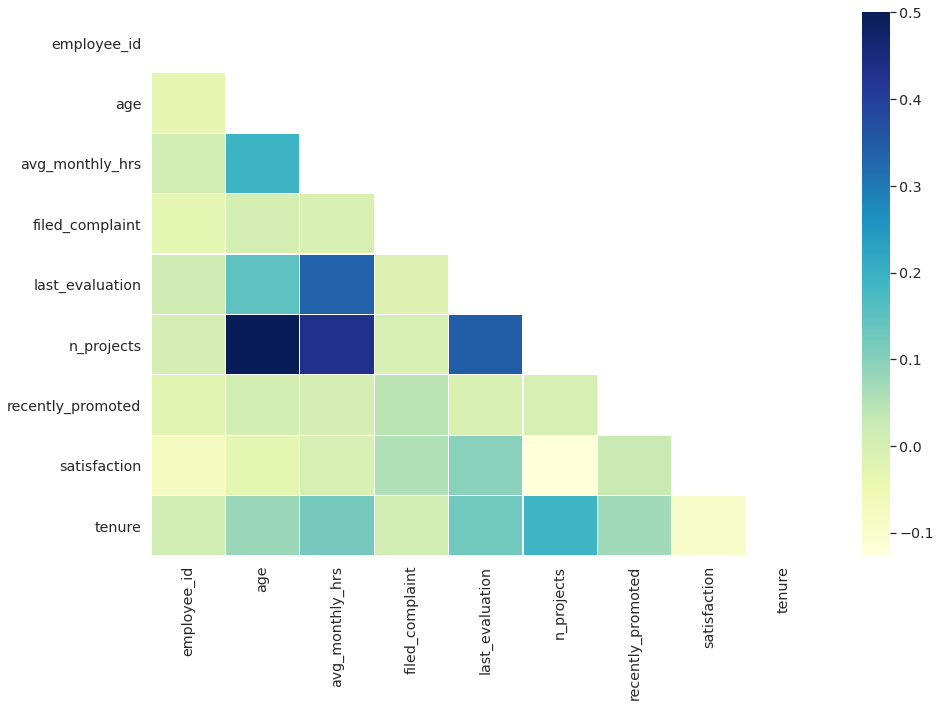

In [ ]:
# Calculate correlations
corr = new_data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
# Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(corr,
            vmax=.5,
            mask=mask,
            # annot=True, fmt='.2f',
            linewidths=.2, cmap="YlGnBu")

In [ ]:
#getting all the numerical variables in our dataset
num_feature = []

for i in new_data.columns.values:
  if ((new_data[i].dtype == int) | (new_data[i].dtype == float)):
    num_feature.append(i)
    
print('Total Numerical Features:', len(num_feature))
print('Features:', num_feature)

# Dropping employee Id
num_feature.remove('employee_id')
print('Final Numerical Features:', num_feature)

Total Numerical Features: 9
Features: ['employee_id', 'age', 'avg_monthly_hrs', 'filed_complaint', 'last_evaluation', 'n_projects', 'recently_promoted', 'satisfaction', 'tenure']
Final Numerical Features: ['age', 'avg_monthly_hrs', 'filed_complaint', 'last_evaluation', 'n_projects', 'recently_promoted', 'satisfaction', 'tenure']


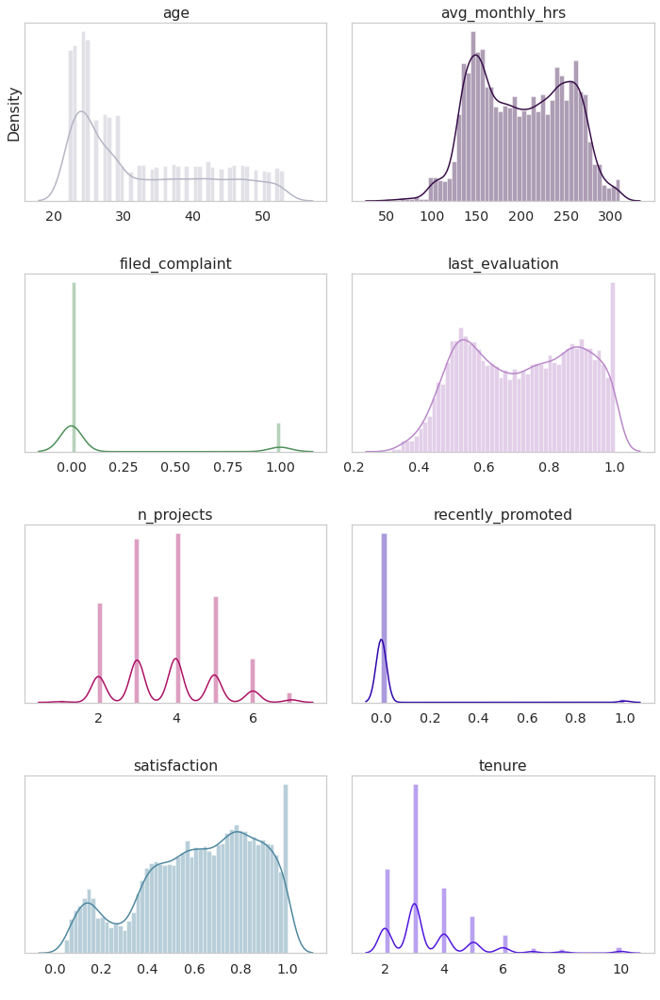

In [ ]:
#plotting all the numerical values
# For Random seed values
from random import randint
fig, axes = plt.subplots(nrows = 4, ncols = 2, sharex = False, figsize=(10, 15))

colors = []
for i in range(8):
  colors.append('#%06X' % randint(0, 0xFFFFFF))

for ax, col, color in zip(axes.flat, num_feature, colors):
  sns.distplot(a = new_data[col], bins = 50, ax = ax, color = color)
  ax.set_title(col)
  plt.setp(axes, yticks=[])
  ax.set_xlabel(' ')
  ax.grid(False)
plt.tight_layout()
plt.show()

**Observation:**
- A slight positive skewness is observed in the distribution of age.
- Most of the data seem to be concentrated around the age between 20-30 age group.


**Identification & Handling of Missing Values**

In [ ]:
#getting the count&percentage of all missing values in the compiled dataset
missing_value_table = pd.DataFrame(new_data.isnull().sum(), columns = ['Frequency'])
missing_value_table['percentage']= (new_data.isnull().sum() * 100 / len(employee_data)).round(2)
missing_value_table.transpose()

,employee_id,age,gender,marital_status,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,status,tenure
Frequency,0.0,0.0,0.0,0.0,127.0,813.00,127.0,1594.00,127.0,127.0,127.0,277.00,127.0,277.00
percentage,0.0,0.0,0.0,0.0,0.9,5.76,0.9,11.29,0.9,0.9,0.9,1.96,0.9,1.96


**Observation:**
  - Problem &rarr; Action Required
  - **Numerical features** &rarr; KNNImputer() to fill missing values.
  -**Categorical features** &rarr; using mode to fill the missing values.

In [ ]:
#getting the numerical features in compiled dataset
numerical_features = new_data.select_dtypes(include=[np.number])
numerical_features.head(2)

,employee_id,age,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure
0,113558,43,111.0,0.0,0.753977,5.0,1.0,0.921208,4.0
1,112256,24,201.0,0.0,0.964453,3.0,0.0,0.568479,3.0


In [ ]:
#creating missing value frame for numerical features
missing_frame = pd.DataFrame(index = numerical_features.columns.values)
missing_frame['Frequency'] = numerical_features.isnull().sum().values
nullpercent = numerical_features.isnull().sum().values/numerical_features.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,employee_id,age,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure
Frequency,0.0,0.0,127.00,127.00,1594.00,127.00,127.00,277.00,277.00
%age,0.0,0.0,0.91,0.91,11.45,0.91,0.91,1.99,1.99


#### 6.1 Using **KNNImputer** to fill the missing values in numeric features.

In [ ]:
# For Imputation
from sklearn.impute import KNNImputer
knn_imputer = KNNImputer()  
df_impute=new_data.filter(['avg_monthly_hrs','last_evaluation','n_projects','satisfaction','tenure'],axis=1)
# Define the imputer
knn_imputer = KNNImputer(n_neighbors=3, weights="uniform")
# Transform the dataset
transformed_values= knn_imputer.fit_transform(df_impute)
transformed_values.shape 
df_filled = pd.DataFrame(data=transformed_values, columns=['avg_monthly_hrs','last_evaluation','n_projects','satisfaction','tenure'])                               
df_filled.head() 

,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
0,111.0,0.753977,5.0,0.921208,4.0
1,201.0,0.964453,3.0,0.568479,3.0
2,239.0,0.756458,3.0,0.144812,6.0
3,151.0,0.608282,5.0,0.210300,6.0
4,259.0,0.749206,4.0,0.888514,3.0


In [ ]:
#checking for missing values frame
missing_frame = pd.DataFrame(index = df_filled.columns.values)
missing_frame['Frequency'] = df_filled.isnull().sum().values
nullpercent = df_filled.isnull().sum().values/numerical_features.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
Frequency,0.0,0.0,0.0,0.0,0.0
%age,0.0,0.0,0.0,0.0,0.0


In [ ]:
#dropping the transformed features in compiled data
new_data=new_data.drop(['avg_monthly_hrs','last_evaluation','n_projects','satisfaction','tenure'],axis=1) 

In [ ]:
#replacing the dropped features with the transformed features
new_data=pd.concat([new_data,df_filled],axis=1)
new_data.head()

,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
0,113558,43,Male,Married,D00-PR,0.0,1.0,medium,Employed,111.0,0.753977,5.0,0.921208,4.0
1,112256,24,Female,Unmarried,D00-MN,0.0,0.0,medium,Employed,201.0,0.964453,3.0,0.568479,3.0
2,112586,22,Female,Unmarried,D00-SS,0.0,0.0,low,Employed,239.0,0.756458,3.0,0.144812,6.0
3,108071,36,Male,Married,D00-PR,0.0,0.0,medium,Employed,151.0,0.608282,5.0,0.210300,6.0
4,116915,38,Male,Married,D00-IT,0.0,0.0,medium,Employed,259.0,0.749206,4.0,0.888514,3.0


####**6.2 Categorical Missing values**


In [ ]:
#getting the categorical features in new data
categorial_features = new_data.select_dtypes(include=[np.object])
categorial_features.head(2)

,gender,marital_status,department,salary,status
0,Male,Married,D00-PR,medium,Employed
1,Female,Unmarried,D00-MN,medium,Employed


In [ ]:
#to check the missing values in categorical features
missing_frame = pd.DataFrame(index = categorial_features.columns.values)
missing_frame['Frequency'] = categorial_features.isnull().sum().values
nullpercent = categorial_features.isnull().sum().values/categorial_features.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,gender,marital_status,department,salary,status
Frequency,0.0,0.0,813.00,127.00,127.00
%age,0.0,0.0,5.84,0.91,0.91


**Observation:**

- **Feature:** 
  - Problem &rarr; Action Required {Reason}
- **department:**
  - Missing information (835) &rarr; Fill missing values with mode.
-**salary**
  - Missing information (129) &rarr; Drop records {Ratio is very less, won't affect the results}
- **status:**
  - Missing information (129) &rarr; Drop records {Ratio is very less, won't affect the results}

####**6.3 Performing operation**

In [ ]:
#filling missing values with mode
new_data['department'].fillna(new_data['department'].mode()[0], inplace=True)


In [ ]:
#dropping salary and status as the missing percentage is less 
print('Data Shape [Before]:', new_data.shape)
new_data.dropna(axis = 0, subset = ['salary', 'status'], inplace = True)
print('Data Shape [After]:', new_data.shape)

Data Shape [Before]: (13923, 14)
Data Shape [After]: (13796, 14)


In [ ]:
#checking for count and percentage of missing values in the dataset
missing_frame = pd.DataFrame(index = new_data.columns.values)
missing_frame['Frequency'] = new_data.isnull().sum().values
nullpercent = new_data.isnull().sum().values/new_data.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
Frequency,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
%age,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### **6.4 Zero Data Identification & Handling**

In [ ]:
#checking for count and percentage of zero values in the dataset
zero_frame = pd.DataFrame(index = new_data.columns.values)
zero_frame['Null Frequency'] = new_data[new_data == 0].count().values
percent = new_data[new_data == 0].count().values / new_data.shape[0]
zero_frame['Missing %age'] = np.round(percent, decimals = 4) * 100
zero_frame.transpose()

,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
Null Frequency,0.0,0.0,0.0,0.0,0.0,11784.00,13504.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Missing %age,0.0,0.0,0.0,0.0,0.0,85.42,97.88,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Observation:**
- while **filed_complaint** and **recently_promoted** seem to have zero data, this maybe due to inconsistent data types.
- We have **successfully handled missing information**.

### **6.5 Identification & Handling of Redundant Data**
 In this section **we will identify redundant rows and columns** in our data if present.



Let's identify whether there are **duplicate rows** present in the data or not.

In [ ]:
#checking for duplicate rows in the dataset
print('Contains Duplicate Rows?', new_data.duplicated().any())
print('Duplicate Count:', new_data.duplicated().sum())

Contains Duplicate Rows? False
Duplicate Count: 0


**Observation:**

- It turns out that there are **no duplicate rows present** in our data.

**Identification & Handling of Duplicate Columns**
- For **handling duplicate features** we have **created a custom function**.

In [ ]:
#using our pre-defined function to check duplicate columns
is_duplicate_cols = duplicateCols(new_data)
print('Contains Duplicate Columns?', is_duplicate_cols)

Contains Duplicate Columns? None


**Observation:**

- It turns out that there are **no duplicate columns present** in our data.

### **6.6 Identification & Handling of Inconsistent Data Types**

In [ ]:
#checking for head of dataset
new_data.head()

,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
0,113558,43,Male,Married,D00-PR,0.0,1.0,medium,Employed,111.0,0.753977,5.0,0.921208,4.0
1,112256,24,Female,Unmarried,D00-MN,0.0,0.0,medium,Employed,201.0,0.964453,3.0,0.568479,3.0
2,112586,22,Female,Unmarried,D00-SS,0.0,0.0,low,Employed,239.0,0.756458,3.0,0.144812,6.0
3,108071,36,Male,Married,D00-PR,0.0,0.0,medium,Employed,151.0,0.608282,5.0,0.210300,6.0
4,116915,38,Male,Married,D00-IT,0.0,0.0,medium,Employed,259.0,0.749206,4.0,0.888514,3.0


In [ ]:
#checking for datatypes
type_frame = pd.DataFrame(data = new_data.dtypes, columns = ['Type'])
type_frame.transpose()

,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
Type,int64,int64,object,object,object,float64,float64,object,object,float64,float64,float64,float64,float64


**Observation:**
- **Inconsistent Feature** [ **Current Type** &rarr; **Desired Type** ]
-**filed_complaint**  [float &rarr; boolean]
-**recently_promoted** [float &rarr; boolean]
- **n_projects** [float &rarr; integer]
- **tenure** [Float &rarr; Integer]

**Performing Correction**

In [ ]:
#changing the datatypes to desired datatypes
new_data['filed_complaint'] = new_data['filed_complaint'].astype(bool)
new_data['recently_promoted'] = new_data['recently_promoted'].astype(bool)
new_data['n_projects'] = new_data['n_projects'].astype(np.int64)
new_data['tenure'] = new_data['tenure'].astype(np.int64)

**After changes: Respective Data Type per Feature**

In [ ]:
#checking the datatype of all features
type_frame = pd.DataFrame(data = new_data.dtypes, columns = ['Type'])
type_frame.transpose()

,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
Type,int64,int64,object,object,object,bool,bool,object,object,float64,float64,int64,float64,int64


In [ ]:
#saving compiled_data as data in csv format
data=pd.DataFrame(new_data)
data.to_csv(r'data.csv')
print('Final data shape:',data.shape)
data.head()

Final data shape: (13796, 14)


,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
0,113558,43,Male,Married,D00-PR,False,True,medium,Employed,111.0,0.753977,5,0.921208,4
1,112256,24,Female,Unmarried,D00-MN,False,False,medium,Employed,201.0,0.964453,3,0.568479,3
2,112586,22,Female,Unmarried,D00-SS,False,False,low,Employed,239.0,0.756458,3,0.144812,6
3,108071,36,Male,Married,D00-PR,False,False,medium,Employed,151.0,0.608282,5,0.210300,6
4,116915,38,Male,Married,D00-IT,False,False,medium,Employed,259.0,0.749206,4,0.888514,3


<a id='section7'></a>
# **7.Post-Profiling Report**

- In post profiling, we identify the changes over cleansed data.

In [ ]:
profile = ProfileReport(df = data)
profile.to_file(output_file = 'Post Profiling Report.html')
print('Accomplished!')


Accomplished!


In [ ]:
#generating  the profiling report 
profile.to_notebook_iframe()

**Observation:**

- Report shows that there are **9 features** i.e. **8 numerical**, **5 categorical** type.
- It created an **df_index** features that's why there are **15 features**.
- There is **no major change** **apart** from the **removal** of **missing information** and **redundant data**.

<a id='section8'></a>
# **8.Exploratory Data Analysis**

**<h4>Question 1: What is the frequency and proportion of current employee status?</h4>**

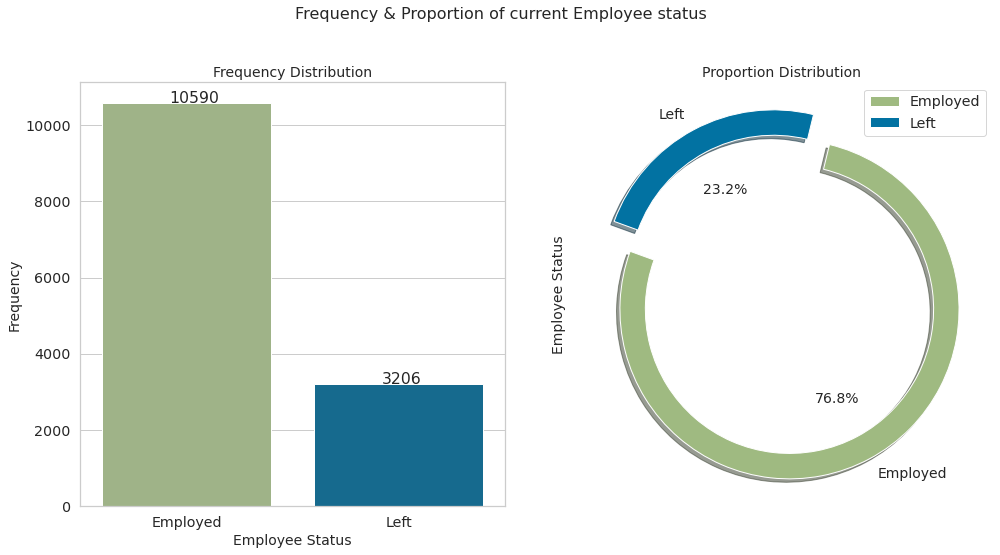

In [ ]:
fig = plt.figure(figsize = [15, 8])
plt.subplot(1, 2, 1)
ax = sns.countplot(x = 'status', data = data, palette = ['#9FBA81', '#0272A2'])
for p in ax.patches:
  percentage = '{}'.format(p.get_height())
  x = p.get_x() + p.get_width() / 2.5
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y))
plt.xlabel(xlabel = 'Employee Status', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = 'Frequency Distribution', size = 14)

plt.subplot(1, 2, 2)
space = np.ones(2)/10
data['status'].value_counts().plot(kind = 'pie', explode = space, fontsize = 14, autopct = '%3.1f%%', wedgeprops = dict(width=0.15), 
                                       shadow = True, startangle = 160, figsize = [15, 8], legend = True,colors=['#9FBA81', '#0272A2'])
plt.ylabel(ylabel = 'Employee Status', size = 14)
plt.title(label = 'Proportion Distribution', size = 14)
plt.tight_layout(pad = 3.0)
plt.suptitle(t = 'Frequency & Proportion of current Employee status', y = 1.02, size = 16)
plt.show()

**Observations:**

- The **left percentage** is **23.8%**.

- Approximately **3355 people left** out of **10761 people**.

- One thing is clear that the **performance evalution metric** is **not accuracy** because we can **observe** **class imbalance**.

**<h4>Question 2: What is the Average age of Ex-employees and Current Employees </h4>**

In [ ]:
(mu, sigma) = norm.fit(data.loc[data['status'] == 'Left', 'age'])
print(
    'Ex-exmployees: average age = {:.1f} years old and standard deviation = {:.1f}'.format(mu, sigma))
(mu, sigma) = norm.fit(data.loc[data['status'] == 'Employed', 'age'])
print('Current exmployees: average age = {:.1f} years old and standard deviation = {:.1f}'.format(
    mu, sigma))

Ex-exmployees: average age = 30.9 years old and standard deviation = 9.4
Current exmployees: average age = 32.8 years old and standard deviation = 9.5


**Observations:**

The age distributions for Active and Ex-employees only differs by one year. 
The average age of ex-employees is  30.9 years old, while 32.8 is the average age for current employees

**<h4>Question 3: What is the Normalised gender distribution of ex-employees ?</h4>**

In [ ]:
print("Normalised gender distribution of ex-employees in the dataset: Male = {:.1f}%; Female {:.1f}%.".format((data[(data['status'] == 'Left') & (
    data['gender'] == 'Male')].shape[0] / data[data['gender'] == 'Male'].shape[0])*100, (data[(data['status'] == 'Left') & (data['gender'] == 'Female')].shape[0] / data[data['gender'] == 'Female'].shape[0])*100))

Normalised gender distribution of ex-employees in the dataset: Male = 19.1%; Female 31.1%.


**Observations:**

Normalised gender distribution of ex-employees in the dataset: Male : 19.1%; Female: 31.1%

**<h4>Question 4: Normalised maritial status distribution of ex-employees ?</h4>**

In [ ]:
print("Normalised maritial status distribution of ex-employees in the dataset: Unmarried = {:.1f}%; Married {:.1f}%.".format((data[(data['status'] == 'Left') & (
    data['marital_status'] == 'Unmarried')].shape[0] / data[data['marital_status'] == 'Unmarried'].shape[0])*100, (data[(data['status'] == 'Left') & (data['marital_status'] == 'Married')].shape[0] / data[data['marital_status'] == 'Married'].shape[0])*100))

Normalised maritial status distribution of ex-employees in the dataset: Unmarried = 27.0%; Married 19.1%.


**Observations:**

Normalised maritial status distribution of ex-employees in the dataset: Unmarried: 27.0%; Married: 19.1%.

**<h4>Question 5: What is the Average Number of Years at the company for currently active employees?</h4>**

In [ ]:
print('Average Number of Years at the company for currently active employees: {:.2f} years and ex-employees: {:.2f} years'.format(
    data[data['status'] == 'Employed']['tenure'].mean(), data[data['status'] == 'Left']['tenure'].mean()))

Average Number of Years at the company for currently active employees: 3.38 years and ex-employees: 3.84 years


Average Number of Years at the company for currently active employees: 3.38 years and ex-employees: 3.84 years (Nearly same)

**<h4>Question 6: What is the frequency and proportion of department?</h4>**

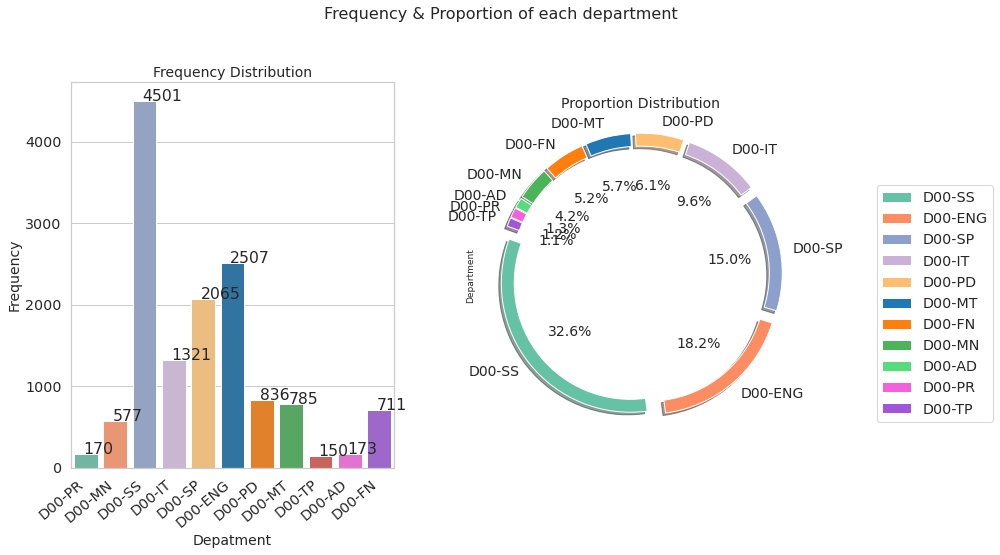

In [ ]:
fig = plt.figure(figsize = [15, 8])
plt.subplot(1, 2, 1)
ax = sns.countplot(x = 'department', data = data,
                   palette = ['#66C2A5', '#FC8D62', '#8DA0CB','#CAB2D6',
                              '#FDBF6F','#1F77B4', '#FF7F0E','#4BB359',
                              '#D9544D','#F461DD', '#A056DB'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) 
  x = p.get_x() + p.get_width() / 2.5
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y))
plt.xlabel(xlabel='Depatment', size = 14)
plt.ylabel(ylabel='Frequency', size = 14)
plt.title(label='Frequency Distribution', size = 14)

plt.subplot(1, 2, 2)
space = np.ones(11)/10
data['department'].value_counts().plot(kind = 'pie', explode = space, fontsize = 14,
                                      autopct = '%3.1f%%', wedgeprops = dict(width = 0.10), 
                                       shadow = True, startangle = 160, figsize = [15, 8], legend = True,
                                      colors = ['#66C2A5', '#FC8D62', '#8DA0CB','#CAB2D6',
                              '#FDBF6F','#1F77B4', '#FF7F0E','#4BB359',
                              '#56DB7F','#F461DD', '#A056DB'])

plt.ylabel(ylabel='Department', size = 9)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=5)
plt.title(label='Proportion Distribution', size = 14)
plt.tight_layout(pad = 3.0)
plt.suptitle(t='Frequency & Proportion of each department', y = 1.02, size = 16)
plt.show()


**Observation:**

- **4601 (32.6%)** **employee** **belongs** to **sales department**.

- **2375 (18.2%)** **employee** **belongs** to **Engineering**.

- **150 (1.1%)** **employee** **belongs** to **temp**.

- **On observing** **above** three **points**, we can say that **majority** of **employees** are from **sales** department. 

**<h4>Question 7: What is the frequency distribution of department with respect to current Employee status?</h4>**

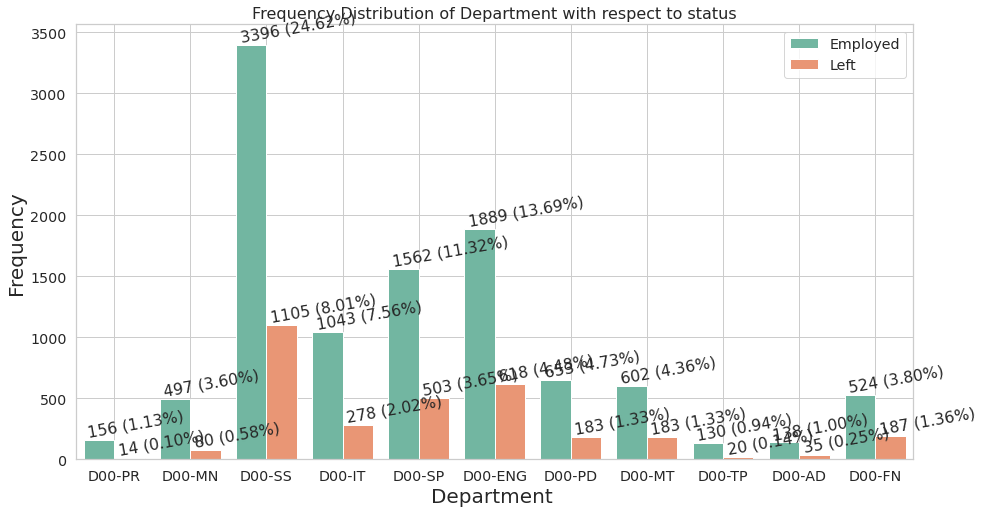

In [ ]:
figure = plt.figure(figsize = [15, 8])
ax = sns.countplot(x = 'department', hue = 'status', data = data, palette = ['#66C2A5', '#FC8D62'])

total = data.shape[0]
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) + ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 10
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y), horizontalalignment='left',verticalalignment='bottom',rotation=10)

plt.xlabel(xlabel = 'Department ', size = 20)
plt.ylabel(ylabel = 'Frequency', size = 20)
plt.title(label = 'Frequency Distribution of Department with respect to status', size = 16)
plt.legend(loc = 'upper right')
plt.grid(b = True)
plt.show()

**Observation:**
- From the above, it is observed that **sales** has the highest percentage(8.18%) of **left** employee followed by **Engineering** with 4.63%.
-Although **Finance** has only **1.37%** **left** for overall employee, it has the **highest percentage ratio(36%)** with respect to **employed** in **each department**.
-**Finance** is followed by **Engineering** with **34%** and **sales** with **33.4%**.  

**<h4>Question 8: What is the frequency distribution of age with respect to status?</h4>**

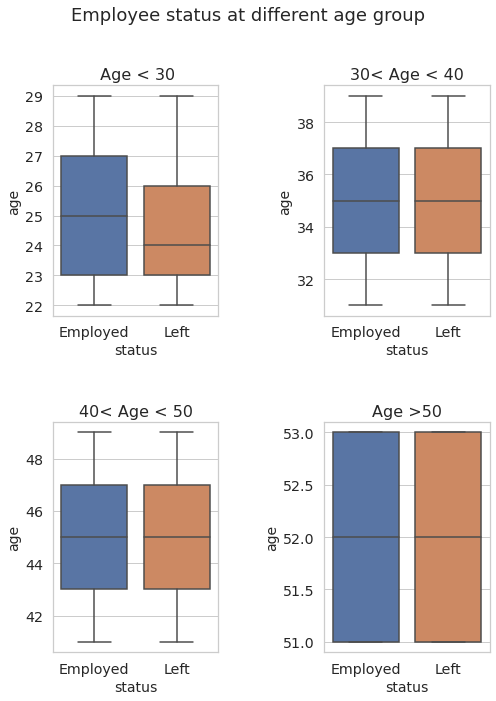

In [ ]:
figure = plt.figure(figsize = [8, 10])
plt.subplot(2, 2, 1)
sns.boxplot(x = 'status', y= 'age', data = data[(data['age'] < 30)])
plt.xlabel('status', size = 14)
plt.ylabel('age', size = 14)
plt.title(' Age < 30', size = 16)

plt.subplot(2, 2, 2)
sns.boxplot(x = 'status', y = 'age', data = data[(data['age'] > 30) & (data['age'] < 40)])
plt.xlabel('status', size = 14)
plt.ylabel('age', size = 14)
plt.title('30< Age < 40', size = 16)

plt.subplot(2, 2, 3)
sns.boxplot(x = 'status', y = 'age', data = data[(data['age'] > 40) & (data['age'] < 50)])
plt.xlabel('status', size = 14)
plt.ylabel('age', size = 14)
plt.title('40< Age < 50', size = 16)

plt.subplot(2, 2, 4)
sns.boxplot(x = 'status', y = 'age', data = data[(data['age'] > 50)])
plt.xlabel('status', size = 14)
plt.ylabel('age', size = 14)
plt.title('Age >50', size = 16)

plt.suptitle('Employee status at different age group', size = 18, y = 1.02)
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**
- We can see that the **median values of employee left** are **higher than the median values of currently employed** for employee age **above 50**.
- While **median values of employee left** are **lower** than that of **currently employed** for employees **below 30 years** of age, the **median values of employed & left are seen to be equal for employees age between 30-40 & 40-50**.  

**<h4>Question 9: What is the frequency and proportion of gender?</h4>**

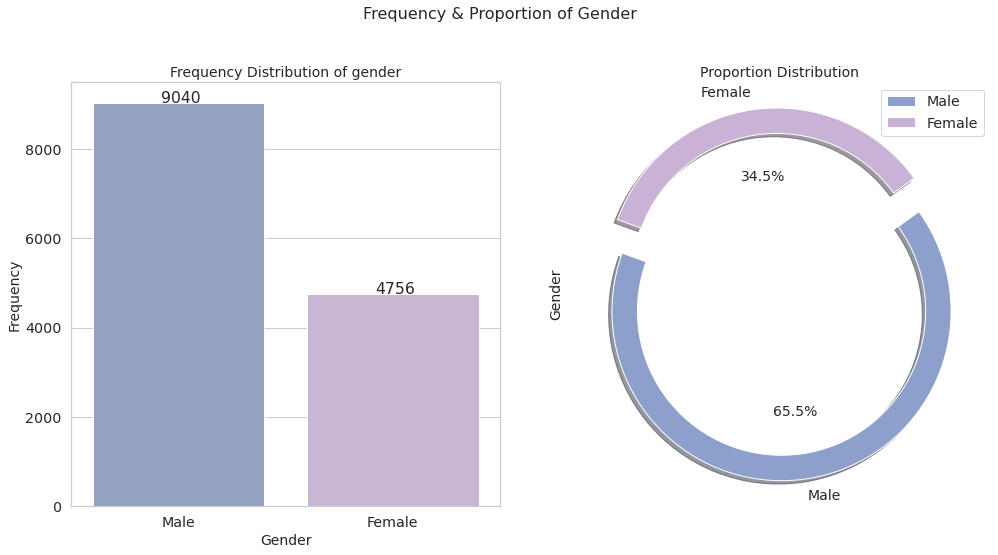

In [ ]:
fig = plt.figure(figsize = [10, 7])
plt.subplot(1, 2, 1)
ax = sns.countplot(x = 'gender', data = data, palette = ['#8DA0CB','#CAB2D6'])
for p in ax.patches:
  percentage = '{}'.format(p.get_height())
  x = p.get_x() + p.get_width() / 2.5
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y))
plt.xlabel(xlabel = 'Gender', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = 'Frequency Distribution of gender', size = 14)

plt.subplot(1, 2, 2)
space = np.ones(2)/10
data['gender'].value_counts().plot(kind = 'pie', explode = space, fontsize = 14, autopct = '%3.1f%%', wedgeprops = dict(width=0.15), 
                                       shadow = True, startangle = 160, figsize = [15, 8], legend = True,colors=['#8DA0CB','#CAB2D6'])
plt.ylabel(ylabel = 'Gender', size = 14)
plt.title(label = 'Proportion Distribution', size = 14)
plt.tight_layout(pad = 3.0)
plt.suptitle(t = 'Frequency & Proportion of Gender', y = 1.02, size = 16)
plt.show()

**Observation:**

There are **9287~65.8% Male** employee and **4829~34.2% Female** employee.

**<h4>Question 10: What is the distribution of gender with respect to status?</h4>**

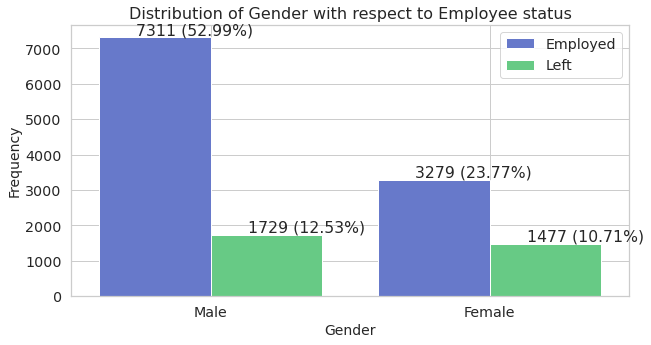

In [ ]:
figure = plt.figure(figsize = [10, 5])
ax = sns.countplot(x = 'gender', hue = 'status', data = data, palette = ['#566FDB', '#56DB7F'])

total = data.shape[0]
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) + ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 3
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y),horizontalalignment='left',verticalalignment='bottom')
  
plt.xlabel(xlabel = 'Gender', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = 'Distribution of Gender with respect to Employee status', size = 16)
plt.legend(loc = 'upper right')
plt.grid(b = True)
plt.show()

**Observation:**
- Among the employee that left, there are **1860 ~ 13.18% Male** and **1495 ~ 10.59% Female**.
- It is important to note that **the number of female employee left is almost have of the total female employee entry in the dataset**. 

**<h4>Question 11: What is the frequency and proportion of marital status and marital status wrt employee status?</h4>**

Text(0.5, 1.0, 'Frequency Distribution of Marital status')

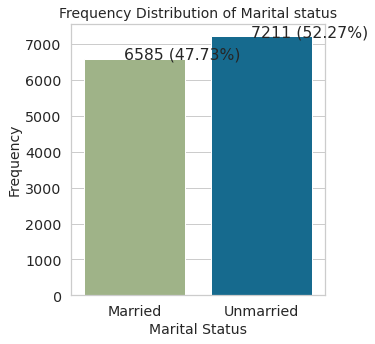

In [ ]:
fig = plt.figure(figsize = [10, 5])
plt.subplot(1, 2, 1)
ax = sns.countplot(x = 'marital_status', data = data, palette = ['#9FBA81', '#0272A2'])
for p in ax.patches:
  percentage = '{}'.format(p.get_height())+ ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 2.5
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y))
plt.xlabel(xlabel = 'Marital Status', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = 'Frequency Distribution of Marital status', size = 14)

**Observation:**

Almost equal distribution of married and unmarried employee is observed.

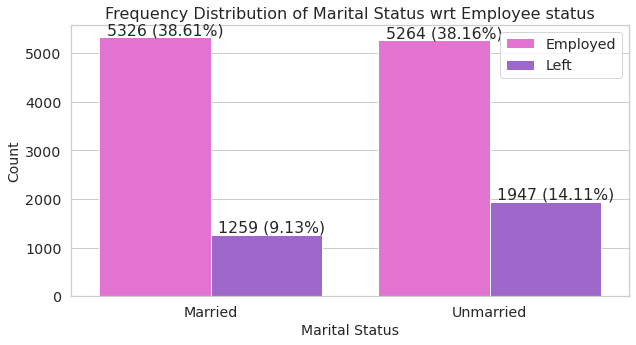

In [ ]:
figure = plt.figure(figsize = [10, 5])
ax = sns.countplot(x = 'marital_status', hue = 'status', data = data, palette=['#F461DD', '#A056DB'])

total = data.shape[0]
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) + ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 15
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y), horizontalalignment='left',verticalalignment='bottom')

plt.xlabel(xlabel = 'Marital Status', size = 14)
plt.ylabel(ylabel = 'Count', size = 14)
plt.title(label = 'Frequency Distribution of Marital Status wrt Employee status', size = 16)
plt.legend(loc = 'upper right')
plt.grid(b = True)
plt.show()

**Observation:**
- There are **9.97% left** and **38.94% Employed** in married while **13.79% of unmarried employees have already left and 37.29% are still employed**. 
- The  **ratio of left and employed in umarried employee is higher than that of married employees.**  

**<h4>Question 12: What is the frequency and proportion of salary and salary wrt employee status?</h4>**

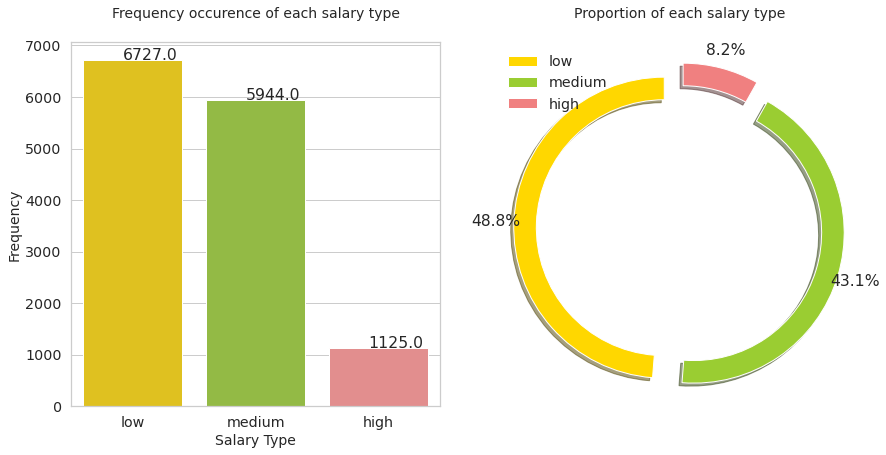

In [ ]:
colors_list = ['gold', 'yellowgreen', 'lightcoral']
figure = plt.figure(figsize = [13, 7])
plt.subplot(1, 2, 1)
ax=sns.barplot(data['salary'].value_counts().index, data['salary'].value_counts(), palette  = colors_list)
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) 
  x = p.get_x() + p.get_width() / 2.5
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y))

plt.xlabel('Salary Type', size = 14)
plt.ylabel('Frequency', size = 14)
plt.title('Frequency occurence of each salary type', y=1.05, size = 14)

space = np.ones(3)/10

plt.subplot(1, 2, 2)
space = np.ones(3)/10
data['salary'].value_counts().plot(kind='pie', figsize=[13, 7], autopct='%3.1f%%', 
                                       startangle=90,wedgeprops = dict(width = 0.15),legend = True,
                                    shadow=True, labels=None, pctdistance=1.12, colors=colors_list, explode=space)                                        
                                      
plt.title('Proportion of each salary type', y=1.05, size = 14)
plt.ylabel('')
plt.axis('equal')
plt.legend(labels = data['salary'].value_counts().index, loc = 'upper left', frameon=False)
plt.grid(b = True)
plt.tight_layout(pad=2.0)
plt.show()

**Observation:**
- we can see that our dataset consist mostly of **low and medium salary type employees**.
- Only **8.1%** of employees are with **high salary** type.

Let's further analyse the **impact of salary on Employee status**.

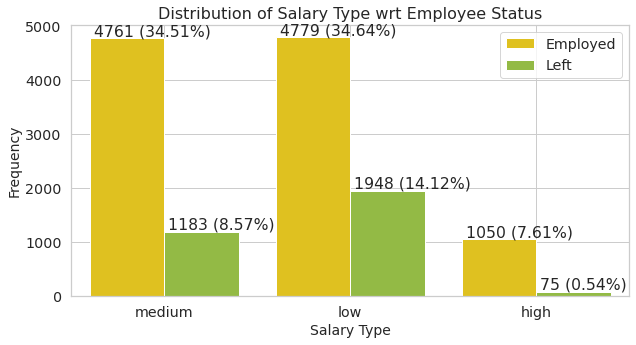

In [ ]:
figure = plt.figure(figsize = [10, 5])
ax = sns.countplot(x = 'salary', hue = 'status', data = data, palette=['gold', 'yellowgreen'])

total = data.shape[0]
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) + ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 20
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y), horizontalalignment='left',verticalalignment='bottom')

plt.xlabel(xlabel = 'Salary Type', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = 'Distribution of Salary Type wrt Employee Status', size = 16)
plt.legend(loc = 'upper right')
plt.grid(b = True)
plt.show()

**Observation:**
- As expected **low salary type** has the **highest percentage(~14.44%)** of **employee left** followed by **medium salary type** with **8.78%**.
- The **proportion of employee Left with respect to currently Employed** is also found to be **highest in low salary type**.

**<h4>Question 13: What is the frequency and proportion of filed_complaint with respect to employee status?</h4>**

Text(0.5, 1.0, 'Employee status vs filed_complaint')

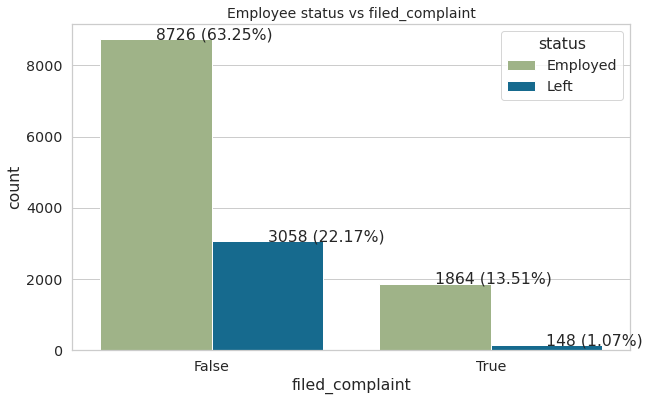

In [ ]:
#plotting filed_complaint against status
fig = plt.figure(figsize = [10, 6])
ax = sns.countplot(x = 'filed_complaint', data = data,hue='status', palette = ['#9FBA81', '#0272A2'])
for p in ax.patches:
  percentage = '{}'.format(p.get_height())+ ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 2
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y))

plt.title(label = 'Employee status vs filed_complaint', size = 14)

**Observation:**

we observed the **Very less amount  of the employees who have filed a complaint has left**.

**<h4>Question 14: What is the frequency and proportion of recently_promoted with respect to employee status?</h4>**

Text(0.5, 1.0, 'Employee status vs recently promoted')

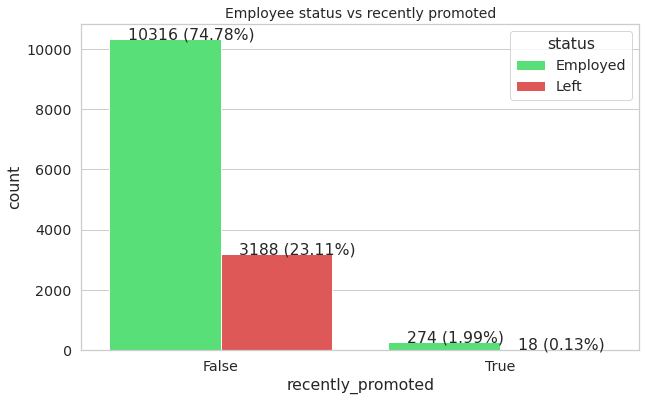

In [ ]:
#plotting recently_promoted against status
fig = plt.figure(figsize = [10, 6])
ax = sns.countplot(x = 'recently_promoted', data = data,hue='status', palette = ['#42f56c', '#f54242'])
#using matplotlib.pyplot.annotate() to make our plot more readable
for p in ax.patches:
  percentage = '{}'.format(p.get_height())+ ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 6
  y = p.get_y() + p.get_height() 
  ax.annotate(percentage, (x, y))

plt.title(label = 'Employee status vs recently promoted', size = 14)

**Observation:**

It is very important to note that **almost all the employees who left were not promoted recently** which might have caused them to leave.

**<h4>Question 15: What is the frequency and proportion of average monthly hours with respect to employee status?</h4>**

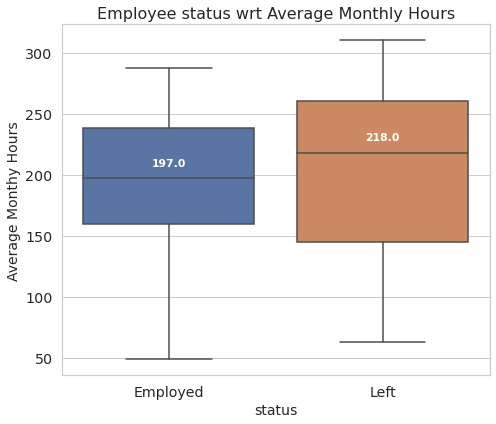

In [ ]:
figure = plt.figure(figsize = [8, 7])
box_plot=sns.boxplot(x='status', y='avg_monthly_hrs',data = data)
medians = data.groupby(['status'])['avg_monthly_hrs'].median()
vertical_offset = data['avg_monthly_hrs'].median() * 0.05 # offset from median for display

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')
plt.xlabel('status', size = 14)
plt.ylabel('Average Monthy Hours', size = 14)
plt.title('Employee status wrt Average Monthly Hours', size = 16)
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**

It is observed that employees who have **left** have **higher average monthly hours spent** in the company **than that of current employees**. 

**<h4>Question 16: What is the frequency and proportion of last_evaluation with respect to employee status?</h4>**

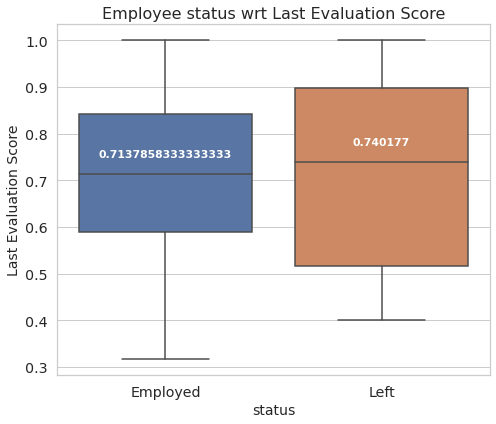

In [ ]:
figure = plt.figure(figsize = [8, 7])
box_plot=sns.boxplot(x='status', y='last_evaluation',data = data)

#to annotate the boxplot for readable context
medians = data.groupby(['status'])['last_evaluation'].median()
vertical_offset = data['last_evaluation'].median() * 0.05 # offset from median for display

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')
plt.xlabel('status', size = 14)
plt.ylabel('Last Evaluation Score', size = 14)
plt.title('Employee status wrt Last Evaluation Score', size = 16)
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**
- It is interesting to note that the **median of last evaluation score for employees who have left is higher than that of current employees**.
- we will do further analysis on **"why employees with good evaluation score have left the company?"** down the line. 

**<h4>Question 17: What is the frequency and proportion of n_projects with respect to employee status?</h4>**

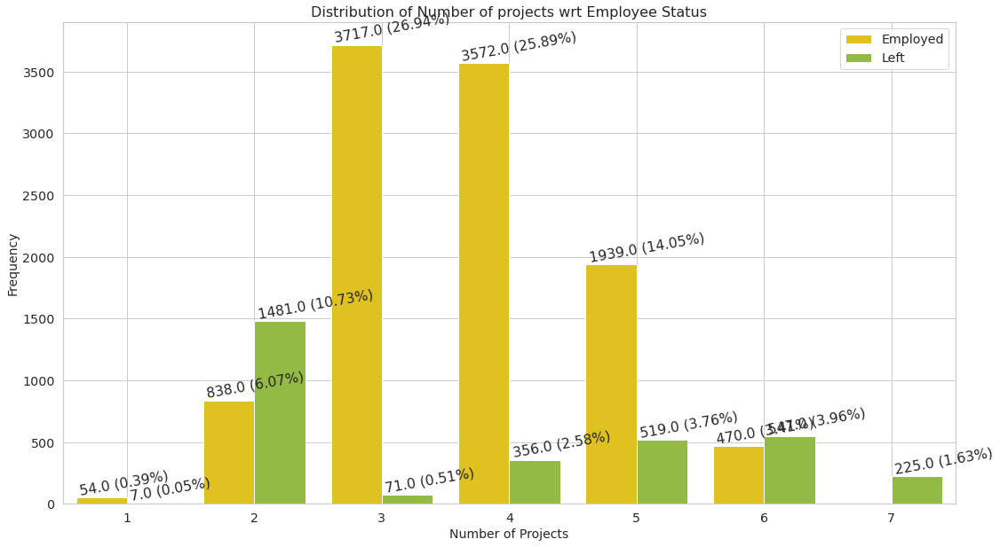

In [ ]:
figure = plt.figure(figsize = [18, 10])
ax = sns.countplot(x = 'n_projects', hue = 'status', data = data, palette=['gold', 'yellowgreen'])

total = data.shape[0]
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) + ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 20
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y), horizontalalignment='left',verticalalignment='bottom',rotation=10)

plt.xlabel(xlabel = 'Number of Projects', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = 'Distribution of Number of projects wrt Employee Status', size = 16)
plt.legend(loc = 'upper right')
plt.grid(b = True)
plt.show()

**Observation:**
- **Majority** of the employee who have **left** have been part of **2 projects**.
- Employees with **number of projects more than 6** have **left** the company, this could be **associated with age**. 

**<h4>Question 18: what is the status of employees based on satisfaction score ?</h4>**

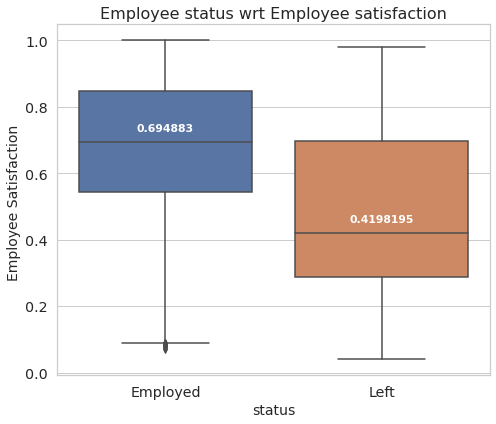

In [ ]:
figure = plt.figure(figsize = [8, 7])
box_plot=sns.boxplot(x='status', y='satisfaction',data = data)

#to annotate the boxplot for readable context
medians = data.groupby(['status'])['satisfaction'].median()
vertical_offset = data['satisfaction'].median() * 0.05 # offset from median for display

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')
plt.xlabel('status', size = 14)
plt.ylabel('Employee Satisfaction ', size = 14)
plt.title('Employee status wrt Employee satisfaction', size = 16)
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**

**Low level of satisfaction** is observed both among employees who have **left** as well as in **current Employees**.

**<h4>Question 19: What is the frequency and proportion of tenure with respect to employee status?</h4>**

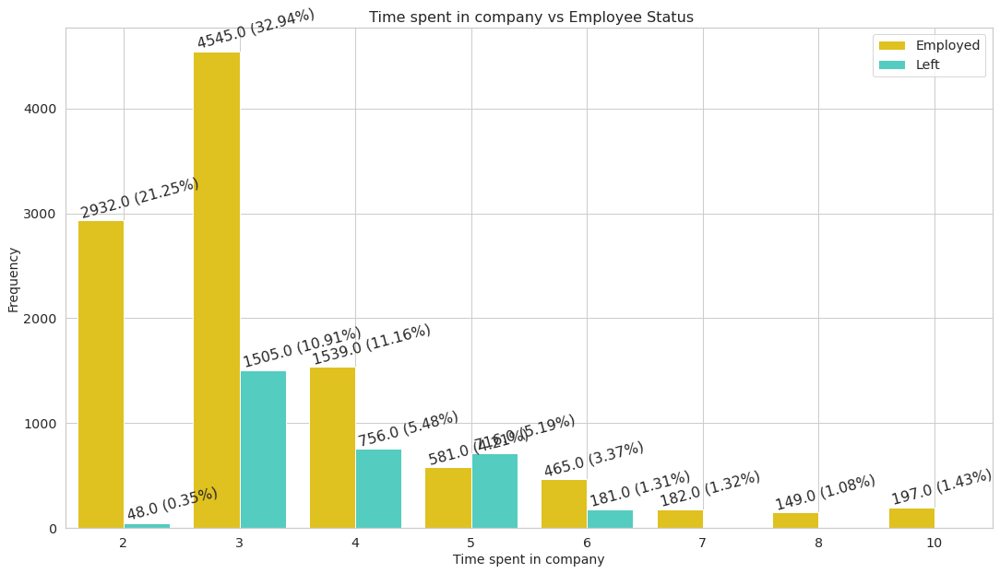

In [ ]:
figure = plt.figure(figsize = [18, 10])
ax = sns.countplot(x = 'tenure', hue = 'status', data = data, palette=['gold','turquoise'])

total = data.shape[0]
for p in ax.patches:
  percentage = '{}'.format(p.get_height()) + ' (' +'{:.2f}%'.format(100*p.get_height()/total) + ')'
  x = p.get_x() + p.get_width() / 20
  y = p.get_y() + p.get_height() + 2
  ax.annotate(percentage, (x, y), horizontalalignment='left',verticalalignment='bottom',rotation=15)

plt.xlabel(xlabel = 'Time spent in company', size = 14)
plt.ylabel(ylabel = 'Frequency', size = 14)
plt.title(label = ' Time spent in company vs Employee Status', size = 16)
plt.legend(loc = 'upper right')
plt.grid(b = True)
plt.show()

**Observation:**

**Majority** of the employee who **left** have **tenure of 3years**.

**<h4>Question 20: How satisfied are employees based on their salary type?</h4>**

In [ ]:
figure = plt.figure(figsize = [10, 7])
sns.boxplot(x = 'salary', y= 'satisfaction',hue='status' ,data = data)
plt.xlabel('salary', size = 14)
plt.ylabel('satisfaction', size = 14)
plt.title('Employee satisfaction based on salary ', size = 16)
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout(pad = 3.0)
plt.show()

NameError: ignored

**Observation:**

The above plot shows that **the average satisfaction of the employees who left is lower than who haven’t left**.

**<h4>Question 21: What is the status of employee left or not based on tenure and salary type ?</h4>**

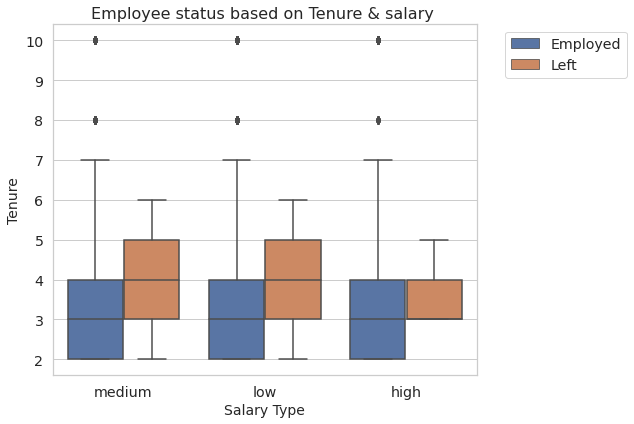

In [ ]:
figure = plt.figure(figsize = [10, 7])
sns.boxplot(x = 'salary', y= 'tenure',hue='status' ,data = data)
plt.xlabel('Salary Type', size = 14)
plt.ylabel('Tenure', size = 14)
plt.title('Employee status based on Tenure & salary ', size = 16)
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**

We can see that the people leaving are more experienced (i.e. higher time spent in company on average) in the low and medium salary class.

**<h4>Question 22: What is the status of employee left or not based on tenure and avg_monthly_hrs ?</h4>**

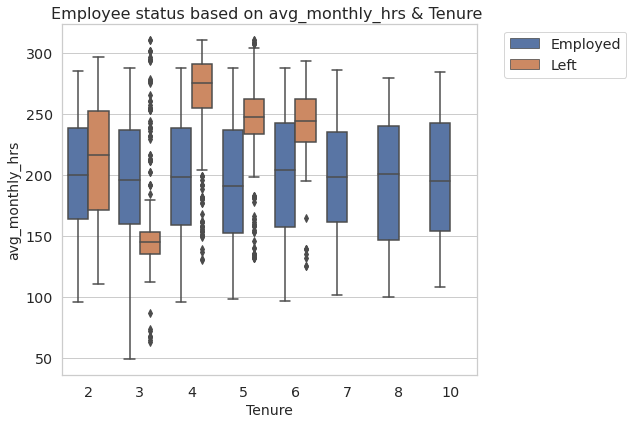

In [ ]:
figure = plt.figure(figsize = [10, 7])
sns.boxplot(x = 'tenure', y= 'avg_monthly_hrs',hue='status' ,data = data)
plt.xlabel('Tenure', size = 14)
plt.ylabel('avg_monthly_hrs', size = 14)
plt.title('Employee status based on avg_monthly_hrs & Tenure ', size = 16)
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**

We observe that **employees** who have **left spent more hours at work**.

**<h4>Question 23: Why are good employees leaving?</h4>**
We define a **good employee** as one who has been in the company for **more than four years**, worked on **four or more projects** or has a **last evaluation greater than or equal to 0.70**.

In [ ]:
#Filtering the good employees that left and selecting only important rows that meets our conditions
data_left = data[data['status'] == 'Left']
good_emp_left = data_left[(data_left['n_projects'] >= 4) & (data_left['last_evaluation'] >=0.70) & (data_left['tenure'] >4) ]
print('good_emp_left shape:',good_emp_left.shape)
print('Employee left:',data_left.shape[0])
good_emp_left.head(3)

good_emp_left shape: (831, 14)
Employee left: 3206


,employee_id,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
9,109162,37,Male,Married,D00-SP,False,False,medium,Left,218.0,0.930761,5,0.800650,5
22,102212,49,Male,Married,D00-PD,True,False,medium,Left,223.0,0.811960,5,0.753583,5
34,121359,25,Female,Unmarried,D00-ENG,False,False,low,Left,271.0,0.946384,5,0.934184,5


 **Below we will visaulize each variable in the dataset pertaining to “good employees” to see what’s going on and draw inference from it.**

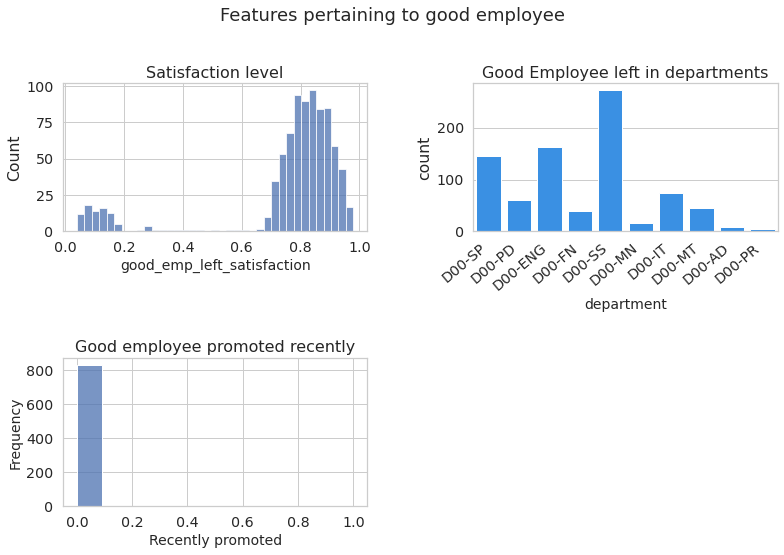

In [ ]:
figure = plt.figure(figsize = [12, 8])
plt.subplot(2, 2, 1)
sns.histplot(x='satisfaction', data = good_emp_left)
plt.xlabel('good_emp_left_satisfaction', size = 14)
plt.title('Satisfaction level', size = 16)

plt.subplot(2, 2, 2)
ax = sns.countplot(x = 'department', data = good_emp_left, palette = [ 'dodgerblue'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.xlabel('department', size = 14)
plt.title('Good Employee left in departments', size = 16)

plt.subplot(2, 2, 3)
sns.histplot(x = 'recently_promoted', data = good_emp_left)
plt.xlabel('Recently promoted', size = 14)
plt.ylabel('Frequency', size = 14)
plt.title('Good employee promoted recently', size = 16)


plt.suptitle('Features pertaining to good employee', size = 18, y = 1.02)
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**
- We can see that most of the **good employees that left** had **very low levels of satisfaction**.

- **Majority** of the **good employees that left belonged to** the **Sales,support and Engineering** departments.
- It is also observed that **majority of the good employees** that **left** were **not promoted recently**.

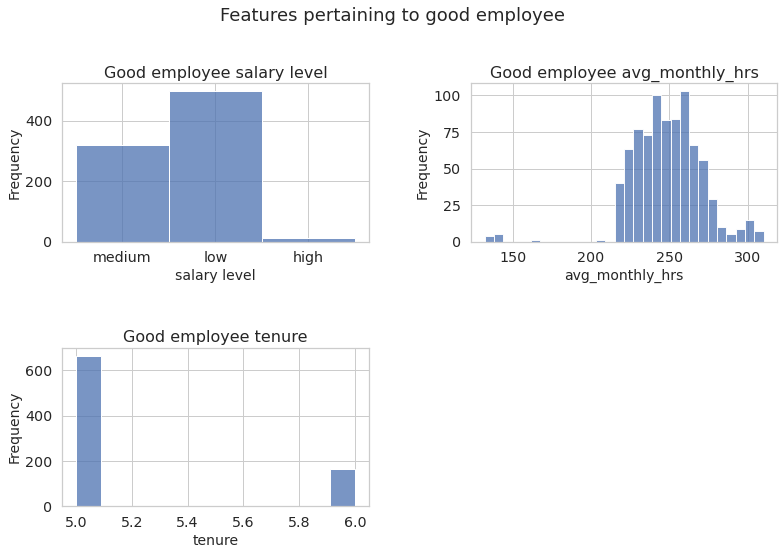

In [ ]:
figure = plt.figure(figsize = [12, 8])
plt.subplot(2, 2, 1)
sns.histplot(x = 'salary', data = good_emp_left)
plt.xlabel('salary level', size = 14)
plt.ylabel('Frequency', size = 14)
plt.title('Good employee salary level', size = 16)

plt.subplot(2, 2, 2)
sns.histplot(x = 'avg_monthly_hrs', data = good_emp_left)
plt.xlabel('avg_monthly_hrs', size = 14)
plt.ylabel('Frequency', size = 14)
plt.title('Good employee avg_monthly_hrs', size = 16)

plt.subplot(2, 2, 3)
sns.histplot(x = 'tenure', data = good_emp_left)
plt.xlabel('tenure', size = 14)
plt.ylabel('Frequency', size = 14)
plt.title('Good employee tenure', size = 16)

plt.suptitle('Features pertaining to good employee', size = 18, y = 1.02)
plt.tight_layout(pad = 3.0)
plt.show()

**Observation:**
- **Majority** of the **good employees that left belonged to** had **low salary**.
- We can see that **majority of the good employees** that **left** were **over worked** and spent many hours in the company.
-**Majority** of the employee that **left** had spent **5 years** in the company.

Hence, we can see that valuable employees left because they were overworked, not promoted in the recent years, were in the low level of salary and were dissatisifed. We have also found that most of the employees leaving are from the Sales / Engineering / support departments.

<a id='section9'></a>
# **9. Post Data Processing & Feature Selection**

- In this part we will **perform encoding over categorical features** and **feed it** to the **Random Forest** because machines can't understand human language.

- **Random Forest** will then **identify important features** for our model **using threshold** over the information gain over reduction in impurity.

In [ ]:
#dropping 'employee_id' from our data
data.drop(['employee_id'], axis = 1, inplace = True)
data.head(1)

,age,gender,marital_status,department,filed_complaint,recently_promoted,salary,status,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
0,43,Male,Married,D00-PR,False,True,medium,Employed,111.0,0.753977,5,0.921208,4



###**9.1 Encoding Categorical Features**

- Before encoding the features we must identify the cardinality of the features.
- Then decide which type of encoding we should perform (Target, Dummy etc.).

In [ ]:
cat_features = []
label_len = []

# Identify Categorical Features
for i in data.columns:
  if (data[i].dtype == object):
    cat_features.append(i)

# Identify Labels Length per Feature
for i in cat_features:
  label_len.append(len(data[i].unique()))

print('Total Categorical Features:', len(cat_features))

# Categorical Feature Frame Representation
cat_frame = pd.DataFrame(data = {'Length': label_len}, index = cat_features)
cat_frame.transpose()

Total Categorical Features: 5


,gender,marital_status,department,salary,status
Length,2,2,11,3,2


**Observation:**

- We can **observe** that **department** has **11 labels**. We will **perform K Fold Target Encoding** over this feature as our **models may struggle with the sparse and large data** with **one hot/ dummy encoding**.

- For **rest** of the **features** we will **perform label encoding**.

**Performing operation:**

###**9.2 Label encoding**

In [ ]:
# For encoding
from sklearn.preprocessing import LabelEncoder
df_encode=data.filter(['gender', 'marital_status','filed_complaint',	'recently_promoted','salary','status'],axis=1)
# Define the encoder
le = LabelEncoder() 
# Transform the dataset
transformed_values= df_encode.apply(le.fit_transform)
transformed_values.shape 
df_transformed = pd.DataFrame(data=transformed_values,
                              columns=['gender','marital_status','filed_complaint',	'recently_promoted','salary','status'])                               
df_transformed.tail() 

,gender,marital_status,filed_complaint,recently_promoted,salary,status
13918,1,1,0,0,1,0
13919,1,0,0,0,2,0
13920,0,0,0,0,2,1
13921,1,1,0,0,2,1
13922,1,0,0,0,2,0


In [ ]:
#dropping the transformed features in copy
data=data.drop(columns=['gender', 'marital_status','filed_complaint',	'recently_promoted','salary','status'])
data.head(3)

,age,department,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure
0,43,D00-PR,111.0,0.753977,5,0.921208,4
1,24,D00-MN,201.0,0.964453,3,0.568479,3
2,22,D00-SS,239.0,0.756458,3,0.144812,6


In [ ]:
#replacing the dropped features with the transformed features
data=pd.concat([data,df_transformed],axis=1)
data.head()

,age,department,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure,gender,marital_status,filed_complaint,recently_promoted,salary,status
0,43,D00-PR,111.0,0.753977,5,0.921208,4,1,0,0,1,2,0
1,24,D00-MN,201.0,0.964453,3,0.568479,3,0,1,0,0,2,0
2,22,D00-SS,239.0,0.756458,3,0.144812,6,0,1,0,0,1,0
3,36,D00-PR,151.0,0.608282,5,0.210300,6,1,0,0,0,2,0
4,38,D00-IT,259.0,0.749206,4,0.888514,3,1,0,0,0,2,0


### **9.3 K Fold Target Encoding**

In [ ]:
# For Custom Transformers
from sklearn.base import BaseEstimator, TransformerMixin
# For KFold Target Encoding
class KFoldTargetEncoderTrain(BaseEstimator,TransformerMixin):
    def __init__(self,colnames,targetName,
                  n_fold=5, verbosity=True,
                  discardOriginal_col=False):
        self.colnames = colnames
        self.targetName = targetName
        self.n_fold = n_fold
        self.verbosity = verbosity
        self.discardOriginal_col = discardOriginal_col
    def fit(self, X, y=None):
        return self
    def transform(self,X):
        assert(type(self.targetName) == str)
        assert(type(self.colnames) == str)
        assert(self.colnames in X.columns)
        assert(self.targetName in X.columns)
        mean_of_target = X[self.targetName].mean()
        kf = KFold(n_splits = self.n_fold,
                   shuffle = False, random_state=2019)
        col_mean_name = self.colnames + '_' + 'Kfold_Target_Enc'
        X[col_mean_name] = np.nan
        for tr_ind, val_ind in kf.split(X):
            X_tr, X_val = X.iloc[tr_ind], X.iloc[val_ind]
            X.loc[X.index[val_ind], col_mean_name] =  X_val[self.colnames].map(X_tr.groupby(self.colnames)
                                     [self.targetName].mean())
            X[col_mean_name].fillna(mean_of_target, inplace = True)
        if self.verbosity:
            encoded_feature = X[col_mean_name].values
            print('Correlation between the new feature, {} and, {}  is {}.'.format(col_mean_name,self.targetName,                    
                   np.corrcoef(X[self.targetName].values,
                               encoded_feature)[0][1]))
        if self.discardOriginal_col:
            X = X.drop(self.targetName, axis=1)
        return X

In [ ]:
from sklearn.model_selection import KFold
# Performing Target Encoding -> department
targetc = KFoldTargetEncoderTrain('department','status',n_fold=5)
data = targetc.fit_transform(data)

Correlation between the new feature, department_Kfold_Target_Enc and, status  is 0.06142893969167513.


In [ ]:
#making copy of our data as we will need it to encode unseen data as well
k_df=data.copy()
k_df.head()

,age,department,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure,gender,marital_status,filed_complaint,recently_promoted,salary,status,department_Kfold_Target_Enc
0,43,D00-PR,111.0,0.753977,5,0.921208,4,1,0,0,1,2,0,0.102941
1,24,D00-MN,201.0,0.964453,3,0.568479,3,0,1,0,0,2,0,0.147505
2,22,D00-SS,239.0,0.756458,3,0.144812,6,0,1,0,0,1,0,0.244966
3,36,D00-PR,151.0,0.608282,5,0.210300,6,1,0,0,0,2,0,0.102941
4,38,D00-IT,259.0,0.749206,4,0.888514,3,1,0,0,0,2,0,0.210724


In [ ]:
data= data.drop(['department'], axis=1) 
data.head(5)

,age,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure,gender,marital_status,filed_complaint,recently_promoted,salary,status,department_Kfold_Target_Enc
0,43,111.0,0.753977,5,0.921208,4,1,0,0,1,2,0,0.102941
1,24,201.0,0.964453,3,0.568479,3,0,1,0,0,2,0,0.147505
2,22,239.0,0.756458,3,0.144812,6,0,1,0,0,1,0,0.244966
3,36,151.0,0.608282,5,0.210300,6,1,0,0,0,2,0,0.102941
4,38,259.0,0.749206,4,0.888514,3,1,0,0,0,2,0,0.210724


**Our dataset is finally ready for model building**.



###**9.4 Feature Selection using Random Forest**

In [ ]:
X = data.drop('status', axis = 1)
y = data['status']

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

selector = SelectFromModel(RandomForestClassifier(n_estimators = 100, random_state = 42, n_jobs = -1))
selector.fit(X, y)
# Extracting list of important features
selected_feat = X.columns[(selector.get_support())].tolist()

print('Total Features Selected are', len(selected_feat))

#Estimated by taking mean(default) of feature importance
print('Threshold set by Model:', np.round(selector.threshold_, decimals = 2))
print('Features:', selected_feat)

Total Features Selected are 5
Threshold set by Model: 0.08
Features: ['avg_monthly_hrs', 'last_evaluation', 'n_projects', 'satisfaction', 'tenure']


**Observation:**

The important features marked by Random Forest are:
  - **avg_monthly_hrs**, **last_evaluation**,**n_projects**, **satisfaction** and **tenure**

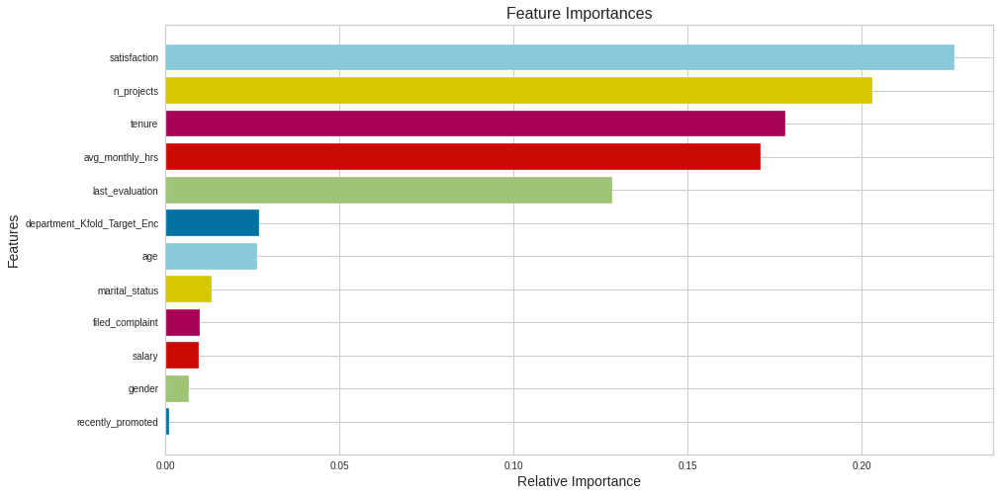

In [ ]:
from yellowbrick.model_selection import FeatureImportances
figure = plt.figure(figsize = [15, 8])

# If you don't want relative importance, use relative = False in below method
viz = FeatureImportances(selector.estimator, relative = False)
viz.fit(X, y)

plt.xlabel('Relative Importance', size = 14)
plt.ylabel('Features', size = 14)
plt.title(label = 'Feature Importances', size = 16)
plt.show()

In [ ]:
data.head()

,age,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure,gender,marital_status,filed_complaint,recently_promoted,salary,status,department_Kfold_Target_Enc
0,43,111.0,0.753977,5,0.921208,4,1,0,0,1,2,0,0.102941
1,24,201.0,0.964453,3,0.568479,3,0,1,0,0,2,0,0.147505
2,22,239.0,0.756458,3,0.144812,6,0,1,0,0,1,0,0.244966
3,36,151.0,0.608282,5,0.210300,6,1,0,0,0,2,0,0.102941
4,38,259.0,0.749206,4,0.888514,3,1,0,0,0,2,0,0.210724


###**9.5 Data Preparation**

we will now **split** our **data** in **training** and **testing** part for further development.

**Note :**
      As the unseen data has 9 columns thats why we need to have 9 columns for the training data too.

In [ ]:
#Preparing y 
y = data['status']

In [ ]:
#Preparing X 
features = ['avg_monthly_hrs', 'last_evaluation', 'n_projects', 'satisfaction', 'tenure','filed_complaint','recently_promoted','salary','department_Kfold_Target_Enc']
X = data[features]

In [ ]:
X.head()

,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure,filed_complaint,recently_promoted,salary,department_Kfold_Target_Enc
0,111.0,0.753977,5,0.921208,4,0,1,2,0.102941
1,201.0,0.964453,3,0.568479,3,0,0,2,0.147505
2,239.0,0.756458,3,0.144812,6,0,0,1,0.244966
3,151.0,0.608282,5,0.210300,6,0,0,2,0.102941
4,259.0,0.749206,4,0.888514,3,0,0,2,0.210724


In [ ]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: status, dtype: int64

In [ ]:
#creating a function which splits a dataframe into train,validation and test
def split_x(df):
    train,test=train_test_split(df,test_size=0.3,random_state=1)
    val,test=train_test_split(test,test_size=0.5,random_state=1)
    return train,val,test

In [ ]:
# For Data Modeling
from sklearn.model_selection import train_test_split, GridSearchCV
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

print('Training Data Shape:', X_train.shape, y_train.shape)
print('Testing Data Shape:', X_test.shape, y_test.shape)


Training Data Shape: (11036, 9) (11036,)
Testing Data Shape: (2760, 9) (2760,)


**Scaling of the data**

In [ ]:
# Standardization - Standardize features by removing the mean and scaling to unit standard deviation 
from sklearn.preprocessing import StandardScaler
Scaler_X = StandardScaler()
X_train = Scaler_X.fit_transform(X_train)
X_test = Scaler_X.transform(X_test)


**Observation:**

Now that we have split out our data, we are **good to go with model development**.

<a id='section10'></a>
# **10. Modelling and Prediction**

### 10.1 Logistic Regression

In [ ]:
#importing 
from sklearn.metrics import jaccard_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,f1_score
from sklearn.metrics import classification_report

###### Build Model

In [ ]:
reg_log = LogisticRegression()
reg_log.fit(X_train, y_train)
y_pred = reg_log.predict(X_test)

###### Fit and Tune Models with cross-validaion

In [ ]:
predicted=cross_val_predict(reg_log,X_test,y_test,cv=2)

###### Evaluate Model

In [ ]:
print ("accuracy",metrics.accuracy_score(y_test, predicted))
print ("f1 score macro",metrics.f1_score(y_test, predicted, average='macro') )
print ("f1 score micro",metrics.f1_score(y_test, predicted, average='micro') )
print ("precision score",metrics.precision_score(y_test, predicted, average='macro')) 
print ("recall score",metrics.recall_score(y_test, predicted, average='macro') )
print ("hamming_loss",metrics.hamming_loss(y_test, predicted))
print ("classification_report", metrics.classification_report(y_test, predicted))
print ("jaccard_score", metrics.jaccard_score(y_test, predicted))
print ("log_loss", metrics.log_loss(y_test, predicted))
print ("zero_one_loss", metrics.zero_one_loss(y_test, predicted))
print ("AUC&ROC",metrics.roc_auc_score(y_test, predicted))
print ("matthews_corrcoef", metrics.matthews_corrcoef(y_test, predicted))

accuracy 0.7652173913043478
f1 score macro 0.5781246019442575
f1 score micro 0.7652173913043478
precision score 0.6421183492942137
recall score 0.5728859829239795
hamming_loss 0.23478260869565218
classification_report               precision    recall  f1-score   support

           0       0.80      0.93      0.86      2119
           1       0.49      0.21      0.30       641

    accuracy                           0.77      2760
   macro avg       0.64      0.57      0.58      2760
weighted avg       0.72      0.77      0.73      2760

jaccard_score 0.17452229299363056
log_loss 8.109145741279736
zero_one_loss 0.23478260869565215
AUC&ROC 0.5728859829239795
matthews_corrcoef 0.20355279983180993


In [ ]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.92      0.86      2119
           1       0.49      0.26      0.34       641

    accuracy                           0.77      2760
   macro avg       0.65      0.59      0.60      2760
weighted avg       0.73      0.77      0.74      2760



In [ ]:
from sklearn.metrics import roc_auc_score,f1_score
print("roc_auc_score: ", roc_auc_score(y_test, y_pred))
print("f1 score: ", f1_score(y_test, y_pred))

roc_auc_score:  0.588283776749843
f1 score:  0.33710174717368957


### **10.2 KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import jaccard_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

###### Build Model

In [ ]:
knn=KNeighborsClassifier()
param_grid_knn_1={
    'n_neighbors':np.arange(3,15,1),
    'weights':['uniform','distance'],
    'algorithm':['auto','brute'],
}
knn_random=RandomizedSearchCV(estimator=knn,param_distributions=param_grid_knn_1,n_iter=1000,n_jobs=-1,cv=5,verbose=1)

In [ ]:
knn_random.fit(X_train,y_train)#training knn algorithm

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   54.0s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  1.1min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=KNeighborsClassifier(algorithm='auto',
                                                  leaf_size=30,
                                                  metric='minkowski',
                                                  metric_params=None,
                                                  n_jobs=None, n_neighbors=5,
                                                  p=2, weights='uniform'),
                   iid='deprecated', n_iter=1000, n_jobs=-1,
                   param_distributions={'algorithm': ['auto', 'brute'],
                                        'n_neighbors': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'weights': ['uniform', 'distance']},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_score=False, scoring=None, verbose=1)

In [ ]:
knn_random.best_params_#getting best performing hyperparameters

{'algorithm': 'brute', 'n_neighbors': 6, 'weights': 'distance'}

###### Declare the HyperParameters to tune the model

In [ ]:
#using grid search to search for best parameters around the output of random search parameters
param_grid_knn2={
    'n_neighbors':np.arange(2,10,1),
    'weights':['uniform','distance'],
    'algorithm':['auto','brute'],
}

In [ ]:
knn_grid=GridSearchCV(estimator=knn,param_grid=param_grid_knn2,n_jobs=-1,cv=5,verbose=1)

In [ ]:
#training knn model with grid search
knn_grid.fit(X_train,y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:   41.1s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=-1,
             param_grid={'algorithm': ['auto', 'brute'],
                         'n_neighbors': array([2, 3, 4, 5, 6, 7, 8, 9]),
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=1)

###### Fit and Tune Models with cross-validaion

In [ ]:
predicted=cross_val_predict(knn_grid,X_test,y_test,cv=2)
#predicting on X_test and y_test.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:    1.8s finished


###### Evaluate Model

In [ ]:
#evaluting the model
print ("accuracy",metrics.accuracy_score(y_test, predicted))
print ("f1 score macro",metrics.f1_score(y_test, predicted, average='macro') )
print ("f1 score micro",metrics.f1_score(y_test, predicted, average='micro') )
print ("precision score",metrics.precision_score(y_test, predicted, average='macro')) 
print ("recall score",metrics.recall_score(y_test, predicted, average='macro') )
print ("hamming_loss",metrics.hamming_loss(y_test, predicted))
print ("classification_report", metrics.classification_report(y_test, predicted))
print ("jaccard_score", metrics.jaccard_score(y_test, predicted))
print ("log_loss", metrics.log_loss(y_test, predicted))
print ("zero_one_loss", metrics.zero_one_loss(y_test, predicted))
print ("AUC&ROC",metrics.roc_auc_score(y_test, predicted))
print ("matthews_corrcoef", metrics.matthews_corrcoef(y_test, predicted))

accuracy 0.9394927536231884
f1 score macro 0.9128015042364825
f1 score micro 0.9394927536231884
precision score 0.9252611698414281
recall score 0.9018349691042856
hamming_loss 0.060507246376811596
classification_report               precision    recall  f1-score   support

           0       0.95      0.97      0.96      2119
           1       0.90      0.83      0.86       641

    accuracy                           0.94      2760
   macro avg       0.93      0.90      0.91      2760
weighted avg       0.94      0.94      0.94      2760

jaccard_score 0.7614285714285715
log_loss 2.0898633457240825
zero_one_loss 0.060507246376811596
AUC&ROC 0.9018349691042856
matthews_corrcoef 0.8267643171895668


### 10.3 Decision Tree

In [ ]:
#importing required 
from sklearn import tree

###### Build Model

In [ ]:
#creating a random search for some hyper parameters given in param_grid_1
dt=tree.DecisionTreeClassifier()
param_grid_1={
    'criterion':['gini','entropy'],
    'max_depth':np.arange(4,20,1),
    'min_samples_split':np.arange(0.001,0.1,0.01),
    'max_features':['log2','sqrt','auto'],
    'min_weight_fraction_leaf':np.arange(0.001,0.25,0.05)
}
r_search=RandomizedSearchCV(dt,param_distributions=param_grid_1,n_iter=1000,verbose=1)
r_search.fit(X_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


[Parallel(n_jobs=1)]: Done 5000 out of 5000 | elapsed:   44.6s finished


RandomizedSearchCV(cv=None, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
       

In [ ]:
#getting best performing hyper parameters from random search 
r_search.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_split': 0.011,
 'min_weight_fraction_leaf': 0.001}

###### Declare the HyperParameters to tune the model

In [ ]:
#creating another parameter grid for grid search by taking values around the best performing random search
#hyper parameters
param_grid_2={
    'criterion':['gini','entropy'],
    'max_depth':np.arange(12,18,1),
    'min_samples_split':np.arange(0.001,0.01,0.01),
    'max_features':['log2','sqrt'],
    'min_weight_fraction_leaf':np.arange(0.001,0.05,0.01)
}

In [ ]:
dt=tree.DecisionTreeClassifier()
grid_search=GridSearchCV(estimator=dt,param_grid = param_grid_2,cv=5,verbose=1,n_jobs=-1)
grid_search.fit(X_train,y_train)
grid_search.best_params_#getting best parameters of grid search

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 120 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Done 300 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    6.7s finished


{'criterion': 'entropy',
 'max_depth': 12,
 'max_features': 'log2',
 'min_samples_split': 0.001,
 'min_weight_fraction_leaf': 0.001}

######Fit and Tune Models with cross-validaion

In [ ]:
predicted=cross_val_predict(grid_search,X_test,y_test,cv=2)
#predicting on X_test and y_test 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 120 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Done 540 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 597 out of 600 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 120 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Done 580 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    1.4s finished


###### Evaluate Model

In [ ]:
print ("accuracy",metrics.accuracy_score(y_test, predicted))
print ("f1 score macro",metrics.f1_score(y_test, predicted, average='macro') )
print ("f1 score micro",metrics.f1_score(y_test, predicted, average='micro') )
print ("precision score",metrics.precision_score(y_test, predicted, average='macro')) 
print ("recall score",metrics.recall_score(y_test, predicted, average='macro') )
print ("hamming_loss",metrics.hamming_loss(y_test, predicted))
print ("classification_report", metrics.classification_report(y_test, predicted))
print ("jaccard_score", metrics.jaccard_score(y_test, predicted))
print ("log_loss", metrics.log_loss(y_test, predicted))
print ("zero_one_loss", metrics.zero_one_loss(y_test, predicted))
print ("AUC&ROC",metrics.roc_auc_score(y_test, predicted))
print ("matthews_corrcoef", metrics.matthews_corrcoef(y_test, predicted))

accuracy 0.9307971014492754
f1 score macro 0.8994529574078867
f1 score micro 0.9307971014492754
precision score 0.9155349366791521
recall score 0.885834574487274
hamming_loss 0.06920289855072463
classification_report               precision    recall  f1-score   support

           0       0.94      0.97      0.96      2119
           1       0.89      0.80      0.84       641

    accuracy                           0.93      2760
   macro avg       0.92      0.89      0.90      2760
weighted avg       0.93      0.93      0.93      2760

jaccard_score 0.7290780141843972
log_loss 2.3902019803128534
zero_one_loss 0.06920289855072459
AUC&ROC 0.885834574487274
matthews_corrcoef 0.8008189445266565


### 10.4 Random Forest

In [ ]:
#importing 
from sklearn.ensemble import RandomForestClassifier

###### Build Model

In [ ]:
reg_rf = RandomForestClassifier()
reg_rf.get_params

<bound method BaseEstimator.get_params of RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)>

In [ ]:
#creating parameter grid for random search
grid_forest_1={'criterion':['gini','entropy'],
      'n_estimators':np.arange(5,200,1),
      'max_depth':np.arange(5,20,1),
      'min_samples_split':np.arange(0.001,0.1,0.01),
      'max_features':['log2','sqrt','auto'],    
      'min_weight_fraction_leaf':np.arange(0.001,0.25,0.05)
}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
#getting best parameters form random search
reg_rf_random=RandomizedSearchCV(estimator=reg_rf,param_distributions=grid_forest_1,n_iter=500,n_jobs=-1,cv=5,verbose=1)

In [ ]:
reg_rf_random.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed: 20.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
reg_rf_random.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'max_features': 'sqrt',
 'min_samples_split': 0.001,
 'min_weight_fraction_leaf': 0.001,
 'n_estimators': 111}

###### Declare the HyperParameters to tune the model

In [ ]:
grid_forest_2={'criterion':['entropy'],
      'n_estimators':np.arange(100,135,5),
      'max_depth':(17,18,19,20,21),
      'min_samples_split':np.arange(0.001,0.01,0.005),
      'max_features':['log2'],    
      'min_weight_fraction_leaf':np.arange(0.0001,0.1,0.005)
}

In [ ]:
rf=RandomForestClassifier()
grid_search_rf=GridSearchCV(estimator=rf,param_grid = grid_forest_2,cv=3,n_jobs=-1,verbose=1)
grid_search_rf.fit(X_train,y_train)

Fitting 3 folds for each of 1400 candidates, totalling 4200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed: 26.7min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 35.0min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 43.8min
[Parallel(n_jobs=-1)]: Done 4200 out of 4200 | elapsed: 45.2min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,...
                         'min_samples_split': array([0.001, 0.006]),
                         'min_weight_fract

###### Fit and Tune Models with cross-validaion

In [ ]:
predicted=cross_val_predict(grid_search_rf,X_test,y_test,cv=2)

Fitting 3 folds for each of 1400 candidates, totalling 4200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   40.0s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 4200 out of 4200 | elapsed: 13.5min finished


Fitting 3 folds for each of 1400 candidates, totalling 4200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   40.1s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 4200 out of 4200 | elapsed: 13.4min finished


###### Evaluate model

In [ ]:
 
print ("accuracy",metrics.accuracy_score(y_test, predicted))
print ("f1 score macro",metrics.f1_score(y_test, predicted, average='macro') )
print ("f1 score micro",metrics.f1_score(y_test, predicted, average='micro') )
print ("precision score",metrics.precision_score(y_test, predicted, average='macro')) 
print ("recall score",metrics.recall_score(y_test, predicted, average='macro') )
print ("hamming_loss",metrics.hamming_loss(y_test, predicted))
print ("classification_report", metrics.classification_report(y_test, predicted))
print ("jaccard_score", metrics.jaccard_score(y_test, predicted))
print ("log_loss", metrics.log_loss(y_test, predicted))
print ("zero_one_loss", metrics.zero_one_loss(y_test, predicted))
print ("AUC&ROC",metrics.roc_auc_score(y_test, predicted))
print ("matthews_corrcoef", metrics.matthews_corrcoef(y_test, predicted))

accuracy 0.966304347826087
f1 score macro 0.9512142738352618
f1 score micro 0.966304347826087
precision score 0.9673555852135375
recall score 0.9372503734505209
hamming_loss 0.03369565217391304
classification_report               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2119
           1       0.97      0.88      0.92       641

    accuracy                           0.97      2760
   macro avg       0.97      0.94      0.95      2760
weighted avg       0.97      0.97      0.97      2760

jaccard_score 0.858877086494689
log_loss 1.1638118106813187
zero_one_loss 0.033695652173913015
AUC&ROC 0.9372503734505209
matthews_corrcoef 0.9041048703968052


In [ ]:
from sklearn.ensemble import RandomForestClassifier
import os
import time
start_time = time.process_time()
model_RF = RandomForestClassifier(criterion= 'entropy',n_estimators = 115, max_depth = 13,min_samples_split= 0.001,
                                  min_weight_fraction_leaf= 0.001,
                                  max_features='sqrt', random_state = 42, n_jobs = -1)
model_RF.fit(X_train, y_train)
y_pred_test = model_RF.predict(X_test)
print('Accuracy Score (Train Data):', np.round(model_RF.score(X_train, y_train), decimals = 3))
print('Accuracy Score (Test Data):', np.round(model_RF.score(X_test, y_test), decimals = 3))
Random_Forest_report = classification_report(y_test, y_pred_test)
print(Random_Forest_report)

from sklearn.metrics import confusion_matrix

confusion_matrix = pd.DataFrame(confusion_matrix(y_test, y_pred_test))

confusion_matrix.index = ['Actual Current Employees','Actual Ex-Employees']
confusion_matrix.columns = ['Predicted Current Employees','Predicted Ex-Employees']
print(confusion_matrix)

plt.figure(figsize = [8,6])
plt.show()

end_time=time.process_time()
Processtime_RF = end_time - start_time
print(start_time, "\n",end_time, "\n Processtime_RF\n",Processtime_RF, "seconds") 

Accuracy Score (Train Data): 0.975
Accuracy Score (Test Data): 0.968
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2119
           1       0.97      0.89      0.93       641

    accuracy                           0.97      2760
   macro avg       0.97      0.94      0.95      2760
weighted avg       0.97      0.97      0.97      2760

                          Predicted Current Employees  Predicted Ex-Employees
Actual Current Employees                         2104                      15
Actual Ex-Employees                                72                     569


<Figure size 576x432 with 0 Axes>

230.105804874 
 233.28443713 
 Processtime_RF
 3.178632255999986 seconds


### 10.5 Gradient Boosting Classifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

###### Build Model

In [ ]:
gbc=GradientBoostingClassifier()
gbc.get_params

<bound method BaseEstimator.get_params of GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)>

In [ ]:
param_grid_gbc_1={
    'n_estimators':np.arange(50,200,10),
    'learning_rate':np.arange(0.01,0.3,0.01),
    'subsample':np.arange(0.5,1.0,0.1),
    'max_depth':np.arange(2,7,1),
    'max_features':['sqrt','log2'],
    'verbose':[1]
}

In [ ]:
random_gbc=RandomizedSearchCV(estimator=gbc,param_distributions=param_grid_gbc_1,n_jobs=-1,n_iter=1000,verbose=1)

In [ ]:
random_gbc.fit(X_train,y_train)
random_gbc.best_params_

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed: 25.7min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 33.7min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 43.0min


###### Declare the HyperParameters to tune the model

In [ ]:
#searching for better parameters in random search with grid search
param_grid_gbc_2={'learning_rate':np.arange(0.1,0.2,0.05),
 'max_depth': (5,6,7,8),
 'max_features': ['log2'],
 'n_estimators': np.arange(158,162,1),
 'subsample': np.arange(0.8,0.9,0.02),
}

In [ ]:
grid_search_gbc=GridSearchCV(estimator=gbc,param_grid=param_grid_gbc_2,n_jobs=-1,cv=3,verbose=1)

In [ ]:
grid_search_gbc.fit(X_train,y_train)

###### Fit and Tune Models with cross-validation

In [ ]:

predicted=cross_val_predict(grid_search_gbc,X_test,y_test,cv=2)
#Predicting on X_test and y_test

Fitting 3 folds for each of 160 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:  2.5min finished


Fitting 3 folds for each of 160 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:  2.5min finished


###### Evaluate Model

In [ ]:
print ("accuracy",metrics.accuracy_score(y_test, predicted))
print ("f1 score macro",metrics.f1_score(y_test, predicted, average='macro') )
print ("f1 score micro",metrics.f1_score(y_test, predicted, average='micro') )
print ("precision score",metrics.precision_score(y_test, predicted, average='macro')) 
print ("recall score",metrics.recall_score(y_test, predicted, average='macro') )
print ("hamming_loss",metrics.hamming_loss(y_test, predicted))
print ("classification_report", metrics.classification_report(y_test, predicted))
print ("jaccard_score", metrics.jaccard_score(y_test, predicted))
print ("log_loss", metrics.log_loss(y_test, predicted))
print ("zero_one_loss", metrics.zero_one_loss(y_test, predicted))
print ("AUC&ROC",metrics.roc_auc_score(y_test, predicted))
print ("matthews_corrcoef", metrics.matthews_corrcoef(y_test, predicted))

accuracy 0.9659420289855073
f1 score macro 0.950889828455127
f1 score micro 0.9659420289855073
precision score 0.9647899684759638
recall score 0.938646625619626
hamming_loss 0.034057971014492754
classification_report               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2119
           1       0.96      0.89      0.92       641

    accuracy                           0.97      2760
   macro avg       0.96      0.94      0.95      2760
weighted avg       0.97      0.97      0.97      2760

jaccard_score 0.8582202111613876
log_loss 1.1763270189366197
zero_one_loss 0.034057971014492705
AUC&ROC 0.938646625619626
matthews_corrcoef 0.9030582512636355


### **10.6 Comparision Of Algorimths**

LR: 0.775733 (0.009177)
LDA: 0.769481 (0.008410)
KNN: 0.955961 (0.006754)
CART: 0.958952 (0.005630)
NB: 0.780718 (0.017693)
RF: 0.977347 (0.004326)
SVM: 0.959043 (0.004932)


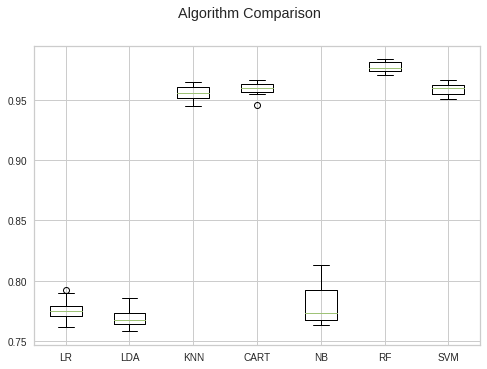

In [ ]:
# Compare Algorithms
import pandas 
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('RF',RandomForestClassifier()))
models.append(('SVM', SVC()))
# evaluate each model in turn
results = []
names = []
scoring ='accuracy'
for name, model in models:
	kfold = model_selection.KFold(n_splits=10,random_state=42)
	cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [ ]:
# intialise data of lists. 
comp = {'Model':['Log_reg', 'KNN', 'DT', 'RF','GBC'],
        'Accuracy':[0.76,0.93,0.93,0.96,0.96],
        'Precision':[0.64,0.92,0.91,0.96,0.96],
        'Recall':[0.57,0.90,0.88,0.93,0.94],
        'f1-score':[0.57,0.91,0.90,0.95,0.95],
        'AUC&ROC':[0.57,0.90,0.88,0.93,0.94]} 
  
comp= pd.DataFrame(comp)
comp

,Model,Accuracy,Precision,Recall,f1-score,AUC&ROC
0,Log_reg,0.76,0.64,0.57,0.57,0.57
1,KNN,0.93,0.92,0.90,0.91,0.90
2,DT,0.93,0.91,0.88,0.90,0.88
3,RF,0.96,0.96,0.93,0.95,0.93
4,GBC,0.96,0.96,0.94,0.95,0.94


###### **Observation** :
We can cleary understand that here the Random Forest is the best model to be used. 

<a id='section11'></a>
#**11. Preprocessing of unseen data**

In [ ]:
#Importing the Unseen Data 
un_df=pd.read_csv('unseen_data.csv')
un_df.head()

,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,tenure,employee_id
0,134,D00-IT,NaN,0.528841,2,NaN,low,0.400464,3.0,119045
1,221,D00-PD,NaN,0.784561,2,NaN,low,0.759513,3.0,112223
2,156,D00-SS,NaN,0.545183,2,NaN,medium,0.336457,3.0,103924
3,133,D00-PR,NaN,NaN,4,NaN,medium,0.832039,2.0,105922
4,135,D00-SS,NaN,0.454637,2,NaN,low,0.320723,5.0,103297


In [ ]:
#Shape of Unseen Data 
un_df.shape

(100, 10)

In [ ]:
#Description of Unseen Data 
un_df.describe()

,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure,employee_id
count,100.000000,15.0,83.000000,100.000000,3.0,97.000000,97.000000,100.000000
mean,198.810000,1.0,0.744114,3.760000,1.0,0.629632,3.422680,112515.750000
std,53.185723,0.0,0.169536,1.349298,0.0,0.246901,1.566811,9466.676715
min,68.000000,1.0,0.396801,1.000000,1.0,0.051515,2.000000,100230.000000
25%,154.500000,1.0,0.576181,3.000000,1.0,0.477002,2.000000,105855.000000
50%,206.000000,1.0,0.748131,4.000000,1.0,0.660827,3.000000,110557.000000
75%,247.500000,1.0,0.901458,5.000000,1.0,0.832039,4.000000,117130.250000
max,289.000000,1.0,1.000000,7.000000,1.0,1.000000,10.000000,145105.000000


In [ ]:
#Information of Unseen Data 
un_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   avg_monthly_hrs    100 non-null    int64  
 1   department         98 non-null     object 
 2   filed_complaint    15 non-null     float64
 3   last_evaluation    83 non-null     float64
 4   n_projects         100 non-null    int64  
 5   recently_promoted  3 non-null      float64
 6   salary             100 non-null    object 
 7   satisfaction       97 non-null     float64
 8   tenure             97 non-null     float64
 9   employee_id        100 non-null    int64  
dtypes: float64(5), int64(3), object(2)
memory usage: 7.9+ KB


In [ ]:
#Checking the count of Department 
un_df.department.value_counts()

D00-SS     27
D00-ENG    17
D00-SP     13
D00-IT      9
D00-MT      7
D00-PD      7
D00-FN      6
D00-MN      5
D00-TP      3
-IT         2
D00-AD      1
D00-PR      1
Name: department, dtype: int64

In [ ]:
#Rename '-IT' with 'DOO-IT' as both represent the same department
print('\nModified Categories:')
un_df=un_df.replace('-IT','D00-IT')
print(un_df['department'].value_counts())


Modified Categories:
D00-SS     27
D00-ENG    17
D00-SP     13
D00-IT     11
D00-MT      7
D00-PD      7
D00-FN      6
D00-MN      5
D00-TP      3
D00-AD      1
D00-PR      1
Name: department, dtype: int64


In [ ]:
#creating missing value frame for numerical features
numerical_features = un_df.select_dtypes(include=[np.number])
missing_frame = pd.DataFrame(index = numerical_features.columns.values)
missing_frame['Frequency'] = numerical_features.isnull().sum().values
nullpercent = numerical_features.isnull().sum().values/numerical_features.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,avg_monthly_hrs,filed_complaint,last_evaluation,n_projects,recently_promoted,satisfaction,tenure,employee_id
Frequency,0.0,85.0,17.0,0.0,97.0,3.0,3.0,0.0
%age,0.0,85.0,17.0,0.0,97.0,3.0,3.0,0.0


 **KnnImputer for numeric features** 

In [ ]:
# For Imputation
from sklearn.impute import KNNImputer
knn_imputer = KNNImputer()  
df_impute=un_df.filter(['last_evaluation','satisfaction','tenure'],axis=1)
# Define the imputer
knn_imputer = KNNImputer(n_neighbors=3, weights="uniform")
# Transform the dataset
transformed_values= knn_imputer.fit_transform(df_impute)
transformed_values.shape 
df_filled = pd.DataFrame(data=transformed_values, columns=['last_evaluation','satisfaction','tenure'])                               
df_filled.head() 

,last_evaluation,satisfaction,tenure
0,0.528841,0.400464,3.0
1,0.784561,0.759513,3.0
2,0.545183,0.336457,3.0
3,0.750318,0.832039,2.0
4,0.454637,0.320723,5.0


In [ ]:
#dropping the transformed features in complied  data
un_df=un_df.drop(['last_evaluation','satisfaction','tenure'],axis=1) 

In [ ]:
un_df=pd.concat([un_df,df_filled],axis=1)
un_df.head()

,avg_monthly_hrs,department,filed_complaint,n_projects,recently_promoted,salary,employee_id,last_evaluation,satisfaction,tenure
0,134,D00-IT,NaN,2,NaN,low,119045,0.528841,0.400464,3.0
1,221,D00-PD,NaN,2,NaN,low,112223,0.784561,0.759513,3.0
2,156,D00-SS,NaN,2,NaN,medium,103924,0.545183,0.336457,3.0
3,133,D00-PR,NaN,4,NaN,medium,105922,0.750318,0.832039,2.0
4,135,D00-SS,NaN,2,NaN,low,103297,0.454637,0.320723,5.0


In [ ]:
#filling nan's of recently_promoted with zero
un_df.filed_complaint.fillna(value=0,axis=0,inplace=True)
un_df.recently_promoted.fillna(value=0,axis=0,inplace=True)

In [ ]:
#creating missing value frame for numerical features
numerical_features = un_df.select_dtypes(include=[np.number])
missing_frame = pd.DataFrame(index = numerical_features.columns.values)
missing_frame['Frequency'] = numerical_features.isnull().sum().values
nullpercent = numerical_features.isnull().sum().values/numerical_features.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,avg_monthly_hrs,filed_complaint,n_projects,recently_promoted,employee_id,last_evaluation,satisfaction,tenure
Frequency,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
%age,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#getting the categorical features in compiled data
categorial_features = un_df.select_dtypes(include=[np.object])
#to check the missing values in categorical features
missing_frame = pd.DataFrame(index = categorial_features.columns.values)
missing_frame['Frequency'] = categorial_features.isnull().sum().values
nullpercent = categorial_features.isnull().sum().values/categorial_features.shape[0]
missing_frame['%age'] = np.round(nullpercent, decimals = 4) * 100
missing_frame.transpose()

,department,salary
Frequency,2.0,0.0
%age,2.0,0.0


In [ ]:
#filling missing values  of 'department' with mode
un_df['department'].fillna(un_df['department'].mode()[0], inplace=True)

In [ ]:
un_df.isnull().sum()

avg_monthly_hrs      0
department           0
filed_complaint      0
n_projects           0
recently_promoted    0
salary               0
employee_id          0
last_evaluation      0
satisfaction         0
tenure               0
dtype: int64

In [ ]:
#saving un_df as utest_df in csv format
utest=pd.DataFrame(un_df)
utest.to_csv(r'utest.csv')
print('Final unseen data shape:',utest.shape)
utest.head()

Final unseen data shape: (100, 10)


,avg_monthly_hrs,department,filed_complaint,n_projects,recently_promoted,salary,employee_id,last_evaluation,satisfaction,tenure
0,134,D00-IT,0.0,2,0.0,low,119045,0.528841,0.400464,3.0
1,221,D00-PD,0.0,2,0.0,low,112223,0.784561,0.759513,3.0
2,156,D00-SS,0.0,2,0.0,medium,103924,0.545183,0.336457,3.0
3,133,D00-PR,0.0,4,0.0,medium,105922,0.750318,0.832039,2.0
4,135,D00-SS,0.0,2,0.0,low,103297,0.454637,0.320723,5.0


 **Post processing**

In [ ]:
cat_features = []
label_len = []

# Identify Categorical Features
for i in utest.columns:
  if (utest[i].dtype == object):
    cat_features.append(i)

# Identify Labels Length per Feature
for i in cat_features:
  label_len.append(len(utest[i].unique()))

print('Total Categorical Features:', len(cat_features))

# Categorical Feature Frame Representation
cat_frame = pd.DataFrame(data = {'Length': label_len}, index = cat_features)
cat_frame.transpose()

Total Categorical Features: 2


,department,salary
Length,11,3


In [ ]:
#label encoding variable salary as we did for our train data
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
utest['salary']=le.fit_transform(utest['salary'])

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
class KFoldTargetEncoderTest(BaseEstimator, TransformerMixin):
    
    def __init__(self,train,colNames,encodedName):
        
        self.train = train
        self.colNames = colNames
        self.encodedName = encodedName
        
    def fit(self, X, y=None):
        return self
    def transform(self,X):
        mean =  self.train[[self.colNames,
                self.encodedName]].groupby(
                                self.colNames).mean().reset_index() 
        
        dd = {}
        for index, row in mean.iterrows():
            dd[row[self.colNames]] = row[self.encodedName]
        X[self.encodedName] = X[self.colNames]
        X = X.replace({self.encodedName: dd})
        return X

In [ ]:
test_targetc = KFoldTargetEncoderTest(k_df,
                                      'department',
                                      'department_Kfold_Target_Enc')
new_utest = test_targetc.fit_transform(utest)

In [ ]:

print('shape:',new_utest.shape)
new_utest.head()


shape: (100, 11)


,avg_monthly_hrs,department,filed_complaint,n_projects,recently_promoted,salary,employee_id,last_evaluation,satisfaction,tenure,department_Kfold_Target_Enc
0,134,D00-IT,0.0,2,0.0,1,119045,0.528841,0.400464,3.0,0.210260
1,221,D00-PD,0.0,2,0.0,1,112223,0.784561,0.759513,3.0,0.219195
2,156,D00-SS,0.0,2,0.0,2,103924,0.545183,0.336457,3.0,0.245445
3,133,D00-PR,0.0,4,0.0,2,105922,0.750318,0.832039,2.0,0.082166
4,135,D00-SS,0.0,2,0.0,1,103297,0.454637,0.320723,5.0,0.245445


In [ ]:
#storing employee_id in id for submission
id= new_utest['employee_id'].tolist() #to maintain the order of employee_id
id=pd.DataFrame(id)
id.head()

,0
0,119045
1,112223
2,103924
3,105922
4,103297


In [ ]:
#dropping original department column and employee_id
new_utest=new_utest.drop(['department','employee_id'],axis=1) 


In [ ]:
new_utest.shape


(100, 9)

In [ ]:
new_utest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   avg_monthly_hrs              100 non-null    int64  
 1   filed_complaint              100 non-null    float64
 2   n_projects                   100 non-null    int64  
 3   recently_promoted            100 non-null    float64
 4   salary                       100 non-null    int64  
 5   last_evaluation              100 non-null    float64
 6   satisfaction                 100 non-null    float64
 7   tenure                       100 non-null    float64
 8   department_Kfold_Target_Enc  100 non-null    float64
dtypes: float64(6), int64(3)
memory usage: 7.2 KB


In [ ]:
new_utest.head()

,avg_monthly_hrs,filed_complaint,n_projects,recently_promoted,salary,last_evaluation,satisfaction,tenure,department_Kfold_Target_Enc
0,134,0.0,2,0.0,1,0.528841,0.400464,3.0,0.210260
1,221,0.0,2,0.0,1,0.784561,0.759513,3.0,0.219195
2,156,0.0,2,0.0,2,0.545183,0.336457,3.0,0.245445
3,133,0.0,4,0.0,2,0.750318,0.832039,2.0,0.082166
4,135,0.0,2,0.0,1,0.454637,0.320723,5.0,0.245445


In [ ]:
new_utest.dtypes

avg_monthly_hrs                  int64
filed_complaint                float64
n_projects                       int64
recently_promoted              float64
salary                           int64
last_evaluation                float64
satisfaction                   float64
tenure                         float64
department_Kfold_Target_Enc    float64
dtype: object

In [ ]:
features = ['avg_monthly_hrs', 'last_evaluation', 'n_projects', 'satisfaction', 'tenure','filed_complaint','recently_promoted','salary','department_Kfold_Target_Enc']
X = new_utest[features]


In [ ]:
X.head()

,avg_monthly_hrs,last_evaluation,n_projects,satisfaction,tenure,filed_complaint,recently_promoted,salary,department_Kfold_Target_Enc
0,134,0.528841,2,0.400464,3.0,0.0,0.0,1,0.210260
1,221,0.784561,2,0.759513,3.0,0.0,0.0,1,0.219195
2,156,0.545183,2,0.336457,3.0,0.0,0.0,2,0.245445
3,133,0.750318,4,0.832039,2.0,0.0,0.0,2,0.082166
4,135,0.454637,2,0.320723,5.0,0.0,0.0,1,0.245445


In [ ]:
new_utest.dtypes

avg_monthly_hrs                  int64
filed_complaint                float64
n_projects                       int64
recently_promoted              float64
salary                           int64
last_evaluation                float64
satisfaction                   float64
tenure                         float64
department_Kfold_Target_Enc    float64
dtype: object

**Scaling the Unseen Data**

In [ ]:
# Standardization - Standardize features by removing the mean and scaling to unit standard deviation 

from sklearn.preprocessing import StandardScaler
Scaler_X = StandardScaler()
X_train_unseen = Scaler_X.fit_transform(X)
scaled_Unseendata = Scaler_X.transform(new_utest)




<a id='section12'></a>
# **12. Using The Best Model for Prediction** 

### 12.1 Random Forest

In [ ]:
#Predicting on Random Forest Model 
y_pred_test = model_RF.predict(scaled_Unseendata)

In [ ]:
#Displaying the predicton 
y_pred_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
#Predicting 
y_pred_proba = model_RF.predict_proba(scaled_Unseendata)
y_pred_proba

array([[0.75354335, 0.24645665],
       [0.89864424, 0.10135576],
       [0.7206085 , 0.2793915 ],
       [0.94221772, 0.05778228],
       [0.75992179, 0.24007821],
       [0.93566112, 0.06433888],
       [0.72989058, 0.27010942],
       [0.7224253 , 0.2775747 ],
       [0.93199959, 0.06800041],
       [0.95516726, 0.04483274],
       [0.87335355, 0.12664645],
       [0.77605229, 0.22394771],
       [0.73988394, 0.26011606],
       [0.94775147, 0.05224853],
       [0.99043127, 0.00956873],
       [0.83974933, 0.16025067],
       [0.7206085 , 0.2793915 ],
       [0.88768372, 0.11231628],
       [0.88421189, 0.11578811],
       [0.96257246, 0.03742754],
       [0.92704956, 0.07295044],
       [0.74205785, 0.25794215],
       [0.92365542, 0.07634458],
       [0.94843881, 0.05156119],
       [0.86125137, 0.13874863],
       [0.88599901, 0.11400099],
       [0.92504287, 0.07495713],
       [0.94460181, 0.05539819],
       [0.91033376, 0.08966624],
       [0.88363018, 0.11636982],
       [0.

In [ ]:
#storing  y_pred into prediction for submission
prediction=pd.DataFrame(y_pred_proba)
prediction.head()

,0,1
0,0.753543,0.246457
1,0.898644,0.101356
2,0.720609,0.279391
3,0.942218,0.057782
4,0.759922,0.240078


In [ ]:
final_proba=prediction.drop(prediction.columns[0],axis=1)
final_proba.head()

,1
0,0.246457
1,0.101356
2,0.279391
3,0.057782
4,0.240078


In [ ]:
submission= pd.concat([id,final_proba],axis=1)
submission.to_csv(r'submission.csv',index=False)
submission.head()

,0,1
0,119045,0.246457
1,112223,0.101356
2,103924,0.279391
3,105922,0.057782
4,103297,0.240078


<a id='section13'></a>
# **13.Conclusion**

- Based on the **EDA** ,we broadly concluded that, **any employee**, irrespective of him being valuable(as per our definition) or not **leaves** if he is **overworked, paid less or is not promoted in recent years**.

- We **developed different machine learning algorithms i.e. Logistic Regression, K-Nearest Neighbor,Decision Tree Classifier, Random Forest Classifier and Gradient Boosting Classifier**.

- Althought **Gradient Boosting Classifier model** had a **slightly higher AUC&ROC** than **other predictive models**, we choose **Random Forest Classifier model** as it is **easier to understand**, can be implemented at **low cost**. Also, this model would **work well for any new data** as we have **used cross validation to train our model**. 


